# data discription

**General Player Information:**

- web_name: The name displayed on the FPL website or other platforms, typically a combination of first and last names.

**Financial & Selection Data:**

- now_cost: The current cost of the player in the FPL game (typically in £m, but without decimal).
- value_form: The player’s value relative to their form (points per cost unit).
- value_season: The player’s value relative to their performance over the season (points per cost unit).
- selected_by_percent: The percentage of FPL managers who have selected this player for their team.

**Team & Position:**
- team: The representing the player's team.
- element_type: The player’s position on the field

**Performance Metrics:**

- minutes: Total minutes played by the player.
- goals_scored: Total goals scored by the player.
- assists: Total assists provided by the player.
- clean_sheets: Number of matches in which the player’s team did not concede a goal.
- goals_conceded: Total goals conceded by the player’s team while he was on the pitch.
- own_goals: Number of own goals scored by the player.
- penalties_saved: Number of penalties saved by the player (typically relevant for goalkeepers).
- penalties_missed: Number of penalties missed by the player.
- yellow_cards: Total yellow cards received by the player.
- red_cards: Total red cards received by the player.
- saves: Number of saves made by the player (relevant for goalkeepers).
- bonus: Bonus points awarded to the player in the FPL game.
- bps: Bonus Point System score, a metric used in FPL to determine bonus points.
- influence: A metric used in FPL that measures the player’s influence on matches.
- creativity: A metric used in FPL that measures the player’s creativity on the pitch.
- threat: A metric used in FPL that measures the player’s threat of scoring goals.
- ict_index: A composite index used in FPL combining Influence, Creativity, and Threat (ICT) metrics.
- Expected Stats (xStats):
- expected_goals: The number of goals a player was expected to score based on the quality of chances.
- expected_assists: The number of assists a player was expected to provide.
- expected_goal_involvements: The total expected goals and assists combined.
- expected_goals_conceded: The number of goals a team was expected to concede while the player was on the pitch.

**Rankings:**

- influence_rank: The player’s rank based on their influence metric.
- creativity_rank: The player’s rank based on their creativity metric.
- threat_rank: The player’s rank based on their threat metric.
- ict_index_rank: The player’s rank based on their ICT index.
- now_cost_rank: The player’s rank based on their current cost.
- form_rank: The player’s rank based on their form.
- points_per_game_rank: The player’s rank based on their points per game.

**Additional Stats:**

- starts: The number of matches the player started.
- corners_and_indirect_freekicks_order, corners_and_indirect_freekicks_text: Information on the player’s involvement in corners and indirect free kicks.
- direct_freekicks_order, direct_freekicks_text: Information on the player’s involvement in direct free kicks.
- penalties_order, penalties_text: Information on the player’s involvement in penalty kicks.
- expected_goals_per_90, expected_assists_per_90, expected_goal_involvements_per_90, expected_goals_conceded_per_90: Per 90 -minutes metrics for expected goals, assists, etc.
- saves_per_90, goals_conceded_per_90, starts_per_90, clean_sheets_per_90: Per 90 minutes metrics for saves, goals conceded, starts, and clean sheets.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from mplsoccer import Radar, FontManager, grid,PyPizza

In [2]:
pd.set_option('display.max_columns',None)

In [3]:
df=pd.read_csv('new_data.csv')
df.head()

,Unnamed: 0,element_type,now_cost,points_per_game,selected_by_percent,team,total_points,value_season,web_name,minutes,goals_scored,assists,clean_sheets,goals_conceded,own_goals,penalties_saved,penalties_missed,yellow_cards,red_cards,saves,bonus,bps,influence,creativity,threat,ict_index,starts,expected_goals,expected_assists,expected_goal_involvements,expected_goals_conceded,influence_rank,influence_rank_type,creativity_rank,creativity_rank_type,threat_rank,threat_rank_type,ict_index_rank,ict_index_rank_type,corners_and_indirect_freekicks_order,direct_freekicks_order,penalties_order,expected_goals_per_90,saves_per_90,expected_assists_per_90,expected_goal_involvements_per_90,expected_goals_conceded_per_90,goals_conceded_per_90,now_cost_rank,now_cost_rank_type,form_rank,form_rank_type,points_per_game_rank,points_per_game_rank_type,selected_rank,selected_rank_type,starts_per_90,clean_sheets_per_90,Name
0,0,MID,5.5,2.2,0.1,Arsenal,24,4.4,Fábio Vieira,290,1,3,1,2,0,0,0,0,1,0,0,67,82.8,88.8,85.0,25.5,2,1.25,0.64,1.89,1.83,336,147,268,147,255,131,322,148,NaN,NaN,4.0,0.39,0.0,0.20,0.59,0.57,0.62,145,89,480,190,251,105,484,173,0.62,0.31,Fábio Ferreira Vieira
1,1,FWD,7.0,3.1,2.2,Arsenal,85,12.1,G.Jesus,1470,4,7,11,11,0,0,0,6,0,0,10,271,364.8,403.0,756.0,152.7,17,6.27,3.26,9.53,11.67,184,20,84,10,30,16,71,16,NaN,NaN,NaN,0.38,0.0,0.20,0.58,0.71,0.67,30,13,564,56,144,22,129,20,1.04,0.67,Gabriel Fernando de Jesus
2,2,DEF,6.0,4.1,12.5,Arsenal,149,24.8,Gabriel,3042,3,1,16,26,1,0,0,4,0,0,8,676,675.8,121.9,379.0,117.9,34,4.48,0.65,5.13,26.18,59,18,239,73,92,4,110,21,NaN,NaN,NaN,0.13,0.0,0.02,0.15,0.77,0.77,82,6,515,196,43,6,33,10,1.01,0.47,Gabriel dos Santos Magalhães
3,3,FWD,8.0,4.9,13.2,Arsenal,180,22.5,Havertz,2627,13,10,16,22,0,0,0,11,0,0,15,515,763.2,613.4,1027.0,240.2,30,12.36,3.88,16.23,21.03,43,8,47,2,14,7,19,5,NaN,NaN,3.0,0.42,0.0,0.13,0.55,0.72,0.75,12,4,583,67,18,4,28,6,1.03,0.55,Kai Havertz
4,4,GK,4.0,0.0,0.2,Arsenal,0,0.0,Hein,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0.00,0.00,0.00,0.00,446,52,437,40,411,24,449,52,NaN,NaN,NaN,0.00,0.0,0.00,0.00,0.00,0.00,573,61,56,23,448,52,368,57,0.00,0.00,Karl Hein


In [4]:
df.columns

Index(['Unnamed: 0', 'element_type', 'now_cost', 'points_per_game',
       'selected_by_percent', 'team', 'total_points', 'value_season',
       'web_name', 'minutes', 'goals_scored', 'assists', 'clean_sheets',
       'goals_conceded', 'own_goals', 'penalties_saved', 'penalties_missed',
       'yellow_cards', 'red_cards', 'saves', 'bonus', 'bps', 'influence',
       'creativity', 'threat', 'ict_index', 'starts', 'expected_goals',
       'expected_assists', 'expected_goal_involvements',
       'expected_goals_conceded', 'influence_rank', 'influence_rank_type',
       'creativity_rank', 'creativity_rank_type', 'threat_rank',
       'threat_rank_type', 'ict_index_rank', 'ict_index_rank_type',
       'corners_and_indirect_freekicks_order', 'direct_freekicks_order',
       'penalties_order', 'expected_goals_per_90', 'saves_per_90',
       'expected_assists_per_90', 'expected_goal_involvements_per_90',
       'expected_goals_conceded_per_90', 'goals_conceded_per_90',
       'now_cost_rank', 

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 594 entries, 0 to 593
Data columns (total 59 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Unnamed: 0                            594 non-null    int64  
 1   element_type                          594 non-null    object 
 2   now_cost                              594 non-null    float64
 3   points_per_game                       594 non-null    float64
 4   selected_by_percent                   594 non-null    float64
 5   team                                  594 non-null    object 
 6   total_points                          594 non-null    int64  
 7   value_season                          594 non-null    float64
 8   web_name                              594 non-null    object 
 9   minutes                               594 non-null    int64  
 10  goals_scored                          594 non-null    int64  
 11  assists            

In [6]:
df.drop(columns=['Unnamed: 0'],inplace=True)

# EDA

In [8]:
df.describe()

,now_cost,points_per_game,selected_by_percent,total_points,value_season,minutes,goals_scored,assists,clean_sheets,goals_conceded,own_goals,penalties_saved,penalties_missed,yellow_cards,red_cards,saves,bonus,bps,influence,creativity,threat,ict_index,starts,expected_goals,expected_assists,expected_goal_involvements,expected_goals_conceded,influence_rank,influence_rank_type,creativity_rank,creativity_rank_type,threat_rank,threat_rank_type,ict_index_rank,ict_index_rank_type,corners_and_indirect_freekicks_order,direct_freekicks_order,penalties_order,expected_goals_per_90,saves_per_90,expected_assists_per_90,expected_goal_involvements_per_90,expected_goals_conceded_per_90,goals_conceded_per_90,now_cost_rank,now_cost_rank_type,form_rank,form_rank_type,points_per_game_rank,points_per_game_rank_type,selected_rank,selected_rank_type,starts_per_90,clean_sheets_per_90
count,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,62.000000,53.000000,49.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000,594.000000
mean,5.076599,1.796128,2.524074,45.580808,8.180303,1045.439394,1.776094,1.589226,2.966330,17.890572,0.062290,0.013468,0.016835,2.166667,0.077441,3.690236,3.670034,200.393939,254.410438,176.689057,165.760943,59.668687,11.715488,1.771835,1.110556,2.882054,17.513872,297.500000,98.545455,297.500000,98.545455,297.500000,98.545455,297.500000,98.545455,2.500000,2.245283,2.102041,0.112525,0.171532,0.063906,0.176431,1.087155,1.170286,297.500000,98.545455,297.500000,98.545455,297.500000,98.545455,297.500000,98.545455,0.624882,0.153552
std,1.087461,1.578140,6.362176,51.017020,8.265324,1086.286915,3.548085,2.807413,3.755452,18.967438,0.268326,0.129158,0.141252,2.725342,0.279839,18.435202,5.705730,218.488745,289.070340,267.696149,268.888713,73.553675,12.484386,3.358679,1.790024,4.693136,18.708576,171.617307,71.005656,171.617307,71.005656,171.617307,71.005656,171.617307,71.005656,1.277164,1.141956,1.005089,0.226756,0.757389,0.090318,0.265231,0.992636,1.577195,171.617307,71.005656,171.617307,71.005656,171.617307,71.005656,171.617307,71.005656,0.494825,0.167721
min,4.000000,0.000000,0.000000,-1.000000,-0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,4.500000,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,149.250000,38.000000,149.250000,38.000000,149.250000,38.000000,149.250000,38.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,149.250000,38.000000,149.250000,38.000000,149.250000,38.000000,149.250000,38.000000,0.000000,0.000000
50%,5.000000,1.800000,0.400000,30.000000,6.200000,775.500000,0.000000,0.000000,1.000000,13.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,134.000000,160.700000,58.200000,39.000000,34.550000,8.000000,0.320000,0.265000,0.880000,11.660000,297.500000,82.000000,297.500000,82.000000,297.500000,82.000000,297.500000,82.000000,2.000000,2.000000,2.000000,0.030000,0.000000,0.030000,0.090000,1.355000,1.285000,297.500000,82.000000,297.500000,82.000000

<Axes: ylabel='element_type'>

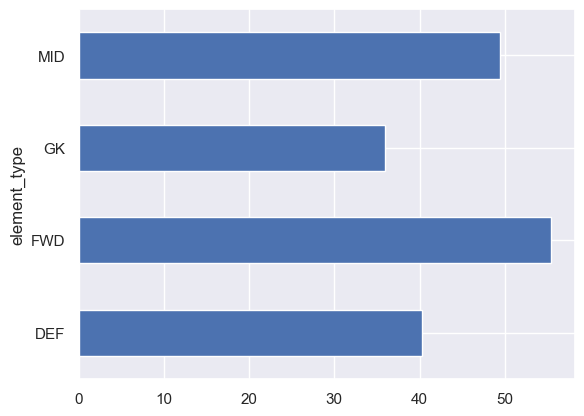

In [188]:
df.groupby('element_type')['total_points'].mean().plot(kind='barh')

In [45]:
#df.to_csv(r'C:\Users\Microsoft\Downloads\fantasy\new_data.csv')

## goalkeepers

In [9]:
df['element_type'].unique()

array(['MID', 'FWD', 'DEF', 'GK'], dtype=object)

In [7]:
GK_df=df.groupby('element_type').get_group('GK')[['now_cost', 'points_per_game',
       'selected_by_percent', 'team', 'total_points', 'value_season',
       'web_name', 'minutes', 'clean_sheets','clean_sheets_per_90',
       'goals_conceded', 'own_goals', 'penalties_saved','saves_per_90',
       'yellow_cards', 'red_cards', 'saves', 'bonus', 'bps','starts','expected_goals_conceded',
        'expected_goals_conceded_per_90', 'goals_conceded_per_90']]

In [8]:
GK_df=GK_df.sort_values(by='total_points',ascending=False)

In [9]:
font_normal = FontManager('https://raw.githubusercontent.com/googlefonts/roboto/main/'
                          'src/hinted/Roboto-Regular.ttf')
font_italic = FontManager('https://raw.githubusercontent.com/googlefonts/roboto/main/'
                          'src/hinted/Roboto-Italic.ttf')
font_bold = FontManager('https://raw.githubusercontent.com/google/fonts/main/apache/robotoslab/'
                        'RobotoSlab[wght].ttf')

In [143]:
def pizzaplot(params,values,min_range,max_range,name,team):
    
    baker = PyPizza(
    params=params,
    min_range=min_range,        # min range values
    max_range=max_range,        # max range values
    background_color="#222222", straight_line_color="#000000",
    last_circle_color="#000000", last_circle_lw=2.5, straight_line_lw=1,
    other_circle_lw=0, other_circle_color="#000000", inner_circle_size=20,
    )

# plot pizza
    fig, ax = baker.make_pizza(
        values,                     # list of values
        figsize=(8, 8),             # adjust figsize according to your need
        color_blank_space="same",   # use same color to fill blank space
        blank_alpha=0.4,            # alpha for blank-space colors
        param_location=110,         # where the parameters will be added
        kwargs_slices=dict(
            facecolor="#1A78CF", edgecolor="#000000",
            zorder=1, linewidth=1,
        ),                          # values to be used when plotting slices
        kwargs_params=dict(
            color="#F2F2F2", fontsize=12, zorder=5,
            fontproperties=font_normal.prop, va="center"
        ),                          # values to be used when adding parameter
        kwargs_values=dict(
            color="#000000", fontsize=12,
            fontproperties=font_normal.prop, zorder=3,
            bbox=dict(
                edgecolor="#000000", facecolor="#1A78CF",
                boxstyle="round,pad=0.2", lw=1
            )
        )                           # values to be used when adding parameter-values
    )

# add title
    fig.text(
        0.515, 0.97, f"{name} - {team}", size=18,
        ha="center", fontproperties=font_bold.prop, color="#F2F2F2"
    )

    # add subtitle
    fig.text(
        0.515, 0.942,
        "Season 2023-24",
        size=15,
        ha="center", fontproperties=font_bold.prop, color="#F2F2F2"
    )

    # add credits
    CREDIT_1 = "data: statsbomb"
    CREDIT_2 = "created by: youssef alarby"

    fig.text(
        0.99, 0.005, f"{CREDIT_1}\n{CREDIT_2}", size=9,
        fontproperties=font_italic.prop, color="#F2F2F2",
        ha="right"
    )
   
    plt.show()

In [11]:
URL1 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-Regular.ttf')
serif_regular = FontManager(URL1)
URL2 = ('https://raw.githubusercontent.com/googlefonts/SourceSerifProGFVersion/main/fonts/'
        'SourceSerifPro-ExtraLight.ttf')
serif_extra_light = FontManager(URL2)
URL3 = ('https://raw.githubusercontent.com/google/fonts/main/ofl/rubikmonoone/'
        'RubikMonoOne-Regular.ttf')
rubik_regular = FontManager(URL3)
URL4 = 'https://raw.githubusercontent.com/googlefonts/roboto/main/src/hinted/Roboto-Thin.ttf'
robotto_thin = FontManager(URL4)
URL5 = ('https://raw.githubusercontent.com/google/fonts/main/apache/robotoslab/'
        'RobotoSlab%5Bwght%5D.ttf')
robotto_bold = FontManager(URL5)

In [98]:
def radar_plot(params,low,high,lower_is_better,values,name,team):
    plt.figure(figsize=(12,8))
    radar = Radar(params, low, high,
              lower_is_better=lower_is_better,
              # whether to round any of the labels to integers instead of decimal places
              round_int=[False]*len(params),
              num_rings=4,  # the number of concentric circles (excluding center circle)
              # if the ring_width is more than the center_circle_radius then
              # the center circle radius will be wider than the width of the concentric circles
              ring_width=1, center_circle_radius=1)
    
    fig, axs = grid(figheight=14, grid_height=0.915, title_height=0.06, endnote_height=0.025,
                title_space=0, endnote_space=0, grid_key='radar', axis=False)

# plot the radar
    radar.setup_axis(ax=axs['radar'], facecolor='None')
    rings_inner = radar.draw_circles(ax=axs['radar'], facecolor='#28252c', edgecolor='#39353f', lw=1.5)
    radar_output = radar.draw_radar(values, ax=axs['radar'],
                                    kwargs_radar={'facecolor': '#d0667a'},
                                    kwargs_rings={'facecolor': '#1d537f'})
    radar_poly, rings_outer, vertices = radar_output
    range_labels = radar.draw_range_labels(ax=axs['radar'], fontsize=25, color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)
    param_labels = radar.draw_param_labels(ax=axs['radar'], fontsize=25, color='#fcfcfc',
                                           fontproperties=robotto_thin.prop)

    # adding the endnote and title text (these axes range from 0-1, i.e. 0, 0 is the bottom left)
    # Note we are slightly offsetting the text from the edges by 0.01 (1%, e.g. 0.99)
    endnote_text = axs['endnote'].text(0.99, 0.5, 'Inspired By: Fantasy / youssef alaraby',
                                       color='#fcfcfc', fontproperties=robotto_thin.prop,
                                       fontsize=15, ha='right', va='center')
    title1_text = axs['title'].text(0.01, 0.65, f'{name}', fontsize=25,
                                    fontproperties=robotto_bold.prop,
                                    ha='left', va='center', color='#e4dded')
    title2_text = axs['title'].text(0.01, 0.25, f'{team}', fontsize=20,
                                    fontproperties=robotto_thin.prop,
                                    ha='left', va='center', color='#e4dded')
    title3_text = axs['title'].text(0.99, 0.65, 'Radar Chart', fontsize=25,
                                    fontproperties=robotto_bold.prop,
                                    ha='right', va='center', color='#e4dded')
    #title4_text = axs['title'].text(0.99, 0.25, 'Midfielder', fontsize=20,
                                    #fontproperties=robotto_thin.prop,
                                    #ha='right', va='center', color='#cc2a3f')

    fig.set_facecolor('#121212')


In [51]:

def plot_bar(data,x_col,y_col,title):
    plt.figure(figsize=(14, 8))
    #sns.set(style="darkgrid")
    #palette = sns.color_palette("husl")
    ax=sns.barplot(data=data,x=x_col,y=y_col)
    for cont in ax.containers:
        ax.bar_label(cont,label_type='edge',padding=4 ,color='red')
    plt.title(f"{title}")
    plt.ylabel(f"{y_col}",fontsize=15)
    plt.xlabel(f"{x_col}")
    ax.set_facecolor('#2E2E2E')
    plt.show()

In [47]:
def create_scatter_plot_with_outliers(df, x_column, y_column, label_column, threshold=2):
    """
    Create a scatter plot using Seaborn with a dark background, white circles, and annotated outliers.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the data.
    x_column (str): The name of the column to be used for the x-axis.
    y_column (str): The name of the column to be used for the y-axis.
    label_column (str): The name of the column containing labels for points (e.g., player names).
    threshold (float): The number of standard deviations away from the mean to consider a point an outlier.
    """
    # Set the style and palette for the plot
    sns.set(style="darkgrid")
    palette = sns.color_palette("husl")  # Using 'husl' for a vibrant color palette

    # Calculate the mean and standard deviation for the y-axis column
    y_mean = df[y_column].mean()
    y_std = df[y_column].std()
    
    # Identify outliers
    outliers = df[np.abs(df[y_column] - y_mean) > threshold * y_std]
    
    # Create the scatter plot
    plt.figure(figsize=(10, 6))
    ax = sns.scatterplot(x=x_column, y=y_column, data=df, s=100, color='white', edgecolor='black')

    # Annotate outliers
    for i in range(len(outliers)):
        ax.text(outliers.iloc[i][x_column], outliers.iloc[i][y_column], 
                outliers.iloc[i][label_column], fontsize=12, color='red', ha='right')
    
    # Set labels and title
    ax.set_xlabel(x_column, fontsize=14, color='white')
    ax.set_ylabel(y_column, fontsize=14, color='white')
    ax.set_title(f'{y_column} vs {x_column} (Outliers Highlighted)', fontsize=16, color='white')

    # Customize plot aesthetics
    ax.set_facecolor('#2E2E2E')  # Darken the plot area background
    #ax.spines['top'].set_visible(True)
    #ax.spines['right'].set_visible(True)
    #ax.spines['left'].set_color('white')
    #ax.spines['bottom'].set_color('white')
    #ax.xaxis.label.set_color('white')
    #ax.yaxis.label.set_color('white')
    #ax.tick_params(colors='white')
    
    # Show the plot
    plt.show()

In [15]:
GK_df.head(10)

,now_cost,points_per_game,selected_by_percent,team,total_points,value_season,web_name,minutes,clean_sheets,clean_sheets_per_90,goals_conceded,own_goals,penalties_saved,saves_per_90,yellow_cards,red_cards,saves,bonus,bps,starts,expected_goals_conceded,expected_goals_conceded_per_90,goals_conceded_per_90
240,5.0,4.0,17.9,Everton,153,30.6,Pickford,3420,13,0.34,51,1,0,3.18,5,0,121,22,734,38,56.01,1.47,1.34
14,5.5,4.2,25.1,Arsenal,135,24.5,Raya,2880,16,0.50,24,0,1,1.44,2,0,46,6,569,32,22.51,0.70,0.75
397,5.0,3.5,6.1,Manchester United,133,26.6,Onana,3420,9,0.24,58,0,0,3.92,5,0,149,10,741,38,69.64,1.83,1.53
256,5.0,3.5,2.9,Fulham,133,26.6,Leno,3420,10,0.26,61,1,0,3.53,3,0,134,15,782,38,64.14,1.69,1.61
93,4.5,3.2,13.0,Brentford,119,26.4,Flekken,3285,7,0.19,63,0,0,3.15,3,0,115,12,685,37,54.01,1.48,1.73
536,4.5,3.7,10.8,West Ham United,116,25.8,Areola,2700,4,0.13,53,1,2,4.60,1,0,138,11,598,31,54.72,1.82,1.77
46,5.0,3.4,13.0,Aston Villa,115,23.0,Martinez,3015,8,0.24,48,2,0,2.84,4,0,95,19,640,34,49.87,1.49,1.43
530,5.0,2.9,4.5,Tottenham Hotspur,112,22.4,Vicario,3420,7,0.18,61,0,0,2.89,2,0,110,9,730,38,63.58,1.67,1.61
360,5.5,3.4,6.4,Manchester City,112,20.4,Ederson M.,2785,11,0.36,27,0,0,1.84,5,0,57,5,569,33,27.43,0.89,0.87
74,4.5,3.4,2.5,Bournemouth,110,24.4,Neto,2880,7,0.22,55,0,1,3.53,5,0,113,14,592,32,49.66,1.55,1.72


<Axes: xlabel='total_points', ylabel='Count'>

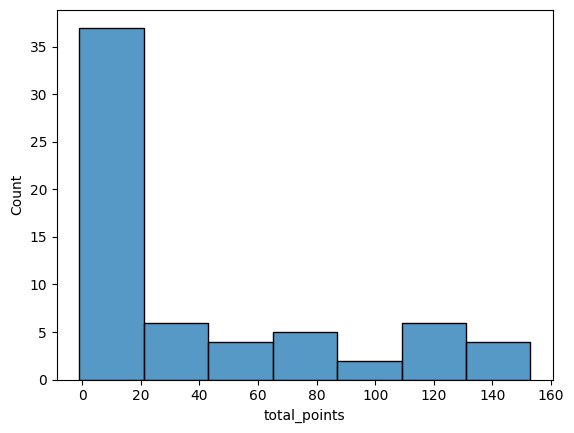

In [19]:
sns.histplot(GK_df['total_points'])

In [24]:
corr=GK_df.corr(numeric_only=True)['total_points']
corr

now_cost                          0.712825
points_per_game                   0.788756
selected_by_percent               0.630676
total_points                      1.000000
value_season                      0.995345
minutes                           0.984119
clean_sheets                      0.918941
clean_sheets_per_90               0.671276
goals_conceded                    0.895397
own_goals                         0.407402
penalties_saved                   0.345656
saves_per_90                      0.714421
saves_per_90                      0.714421
yellow_cards                      0.843511
red_cards                              NaN
saves                             0.925861
bonus                             0.882922
bps                               0.987627
starts                            0.984286
expected_goals_conceded           0.928347
expected_goals_conceded_per_90    0.666448
goals_conceded_per_90             0.054398
Name: total_points, dtype: float64

In [16]:
GK_df.columns

Index(['now_cost', 'points_per_game', 'selected_by_percent', 'team',
       'total_points', 'value_season', 'web_name', 'minutes', 'clean_sheets',
       'clean_sheets_per_90', 'goals_conceded', 'own_goals', 'penalties_saved',
       'saves_per_90', 'yellow_cards', 'red_cards', 'saves', 'bonus', 'bps',
       'starts', 'expected_goals_conceded', 'expected_goals_conceded_per_90',
       'goals_conceded_per_90'],
      dtype='object')

In [55]:
GK_df.iloc[0]

now_cost                               5.0
points_per_game                        4.0
selected_by_percent                   17.9
team                               Everton
total_points                           153
value_season                          30.6
web_name                          Pickford
minutes                               3420
clean_sheets                            13
clean_sheets_per_90                   0.34
goals_conceded                          51
own_goals                                1
penalties_saved                          0
saves_per_90                          3.18
yellow_cards                             5
red_cards                                0
saves                                  121
bonus                                   22
bps                                    734
starts                                  38
expected_goals_conceded              56.01
expected_goals_conceded_per_90        1.47
goals_conceded_per_90                 1.34
Name: 240, 

In [ ]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(12, 16))


In [91]:
param=['now_cost', 'points_per_game', 'selected_by_percent',
       'total_points', 'value_season', 'minutes', 'clean_sheets',
       'clean_sheets_per_90', 'goals_conceded','penalties_saved',
       'saves_per_90', 'yellow_cards','saves','bonus', 'bps',
       'starts','expected_goals_conceded', 'expected_goals_conceded_per_90',
       'goals_conceded_per_90']

param2=['now_cost', 'ppgame', 'selected_percent',
       'T_pts', 'value_season', 'minutes', 'C_Sheets',
       'CS_90', 'GC','P_saved',
       'saves_90', 'YC','saves','bonus', 'bps',
       'starts','XGC', 'XGC_90',
       'GC_90']


In [83]:
low_is_better=['now_cost','goals_conceded','yellow_cards',
               'expected_goals_conceded','expected_goals_conceded_per_90','goals_conceded_per_90']

In [161]:
def find_low_high(data,param):
    low=[]
    high=[]
    for col in param:
        low.append(data[col].min()-1)
        high.append(data[col].max()+1)
    return low,high

<Figure size 1200x800 with 0 Axes>

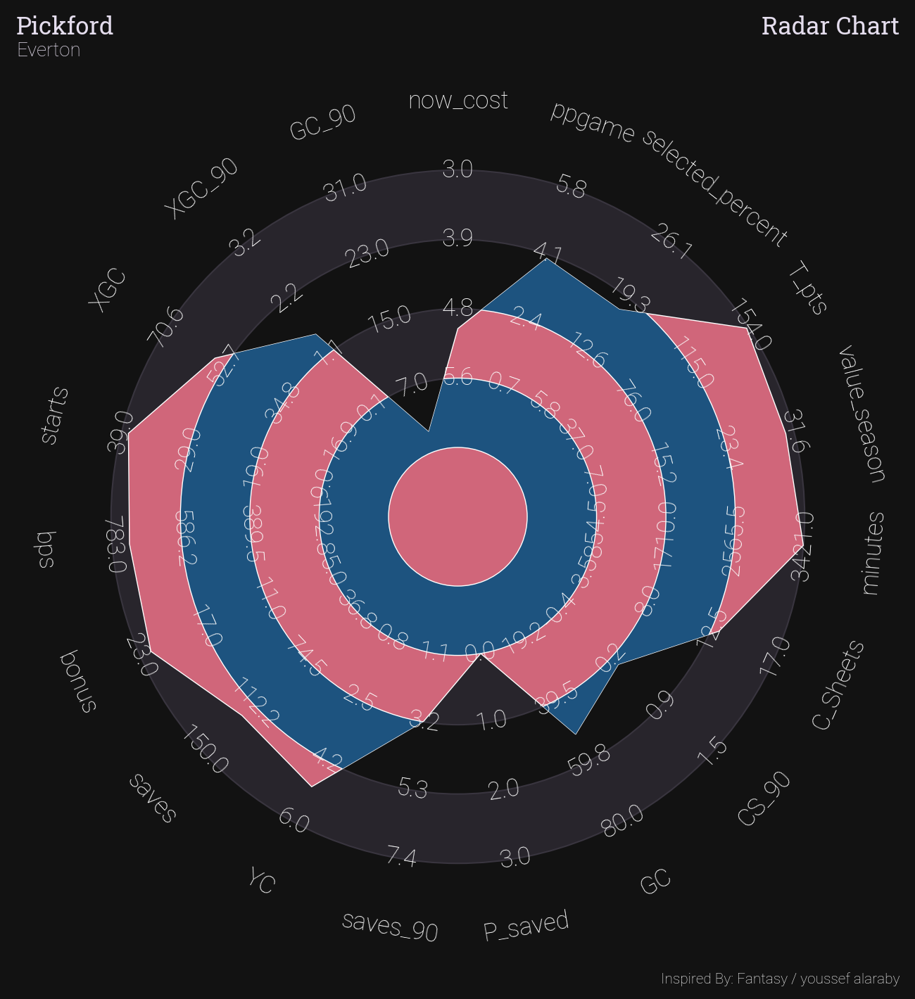

In [99]:
#plt.figure(figsize=(8,8))
radar_plot(param2,low,high,low_is_better,values,name,team)

In [156]:
def prepare_data(data,param,num):
    values=[]
    names=[]
    teams=[]
    for i in range(num):
        val=[]
        for col in param:
            val.append(data.iloc[i][col])
        names.append(data.iloc[i]['web_name'])
        teams.append(data.iloc[i]['team'])
        values.append(val)
    return values,names,teams


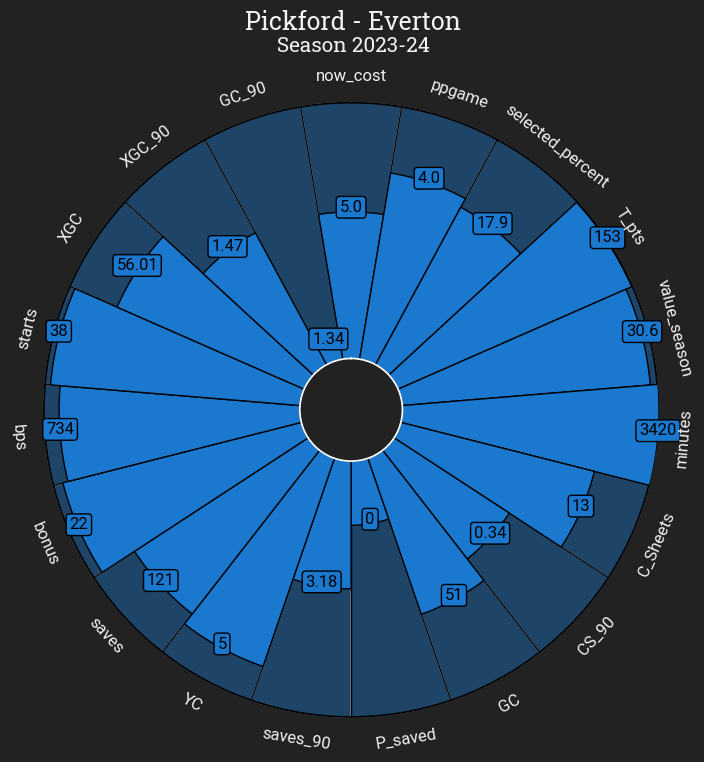

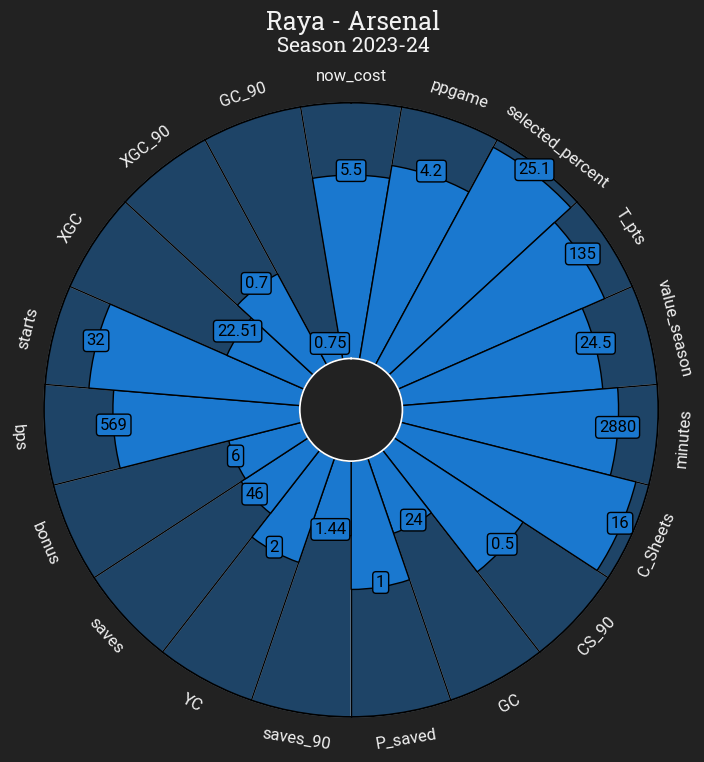

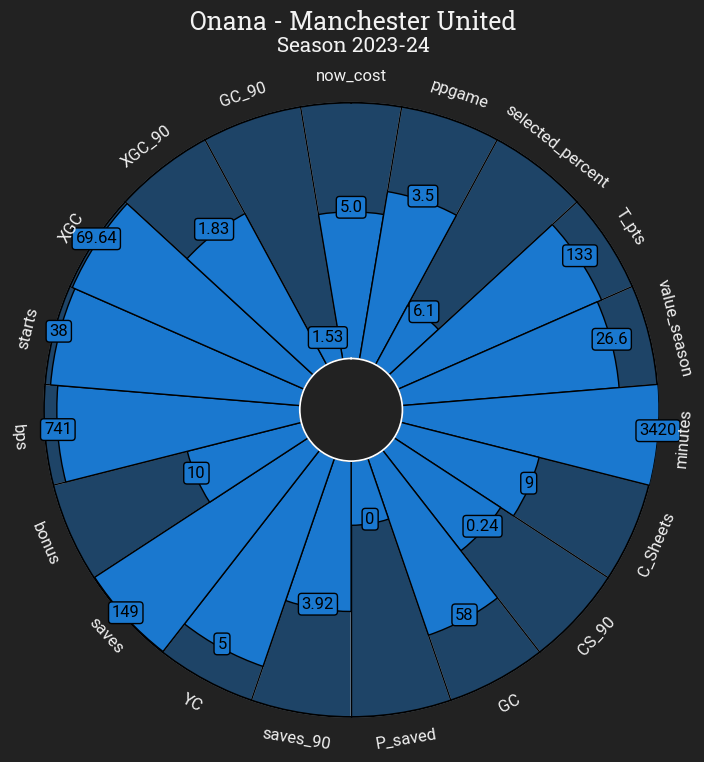

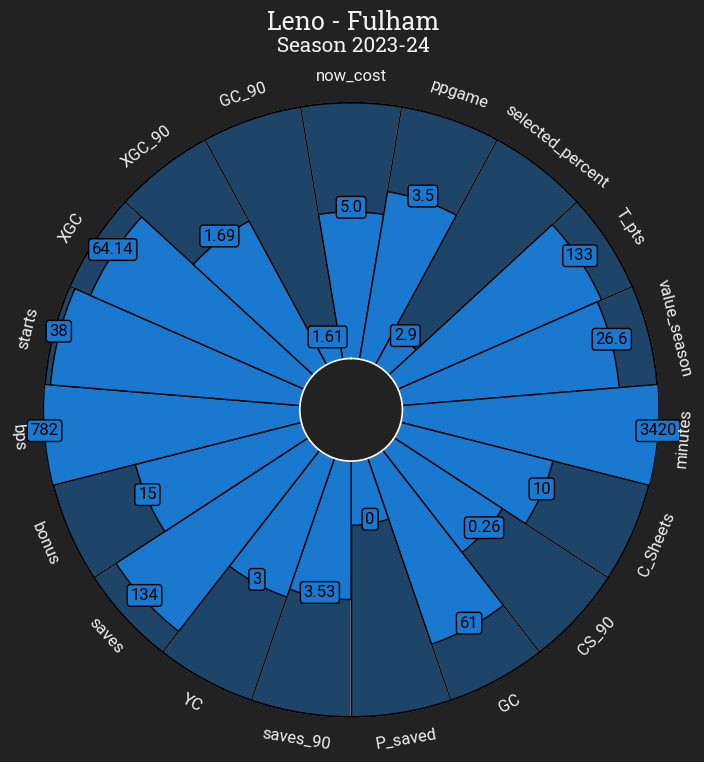

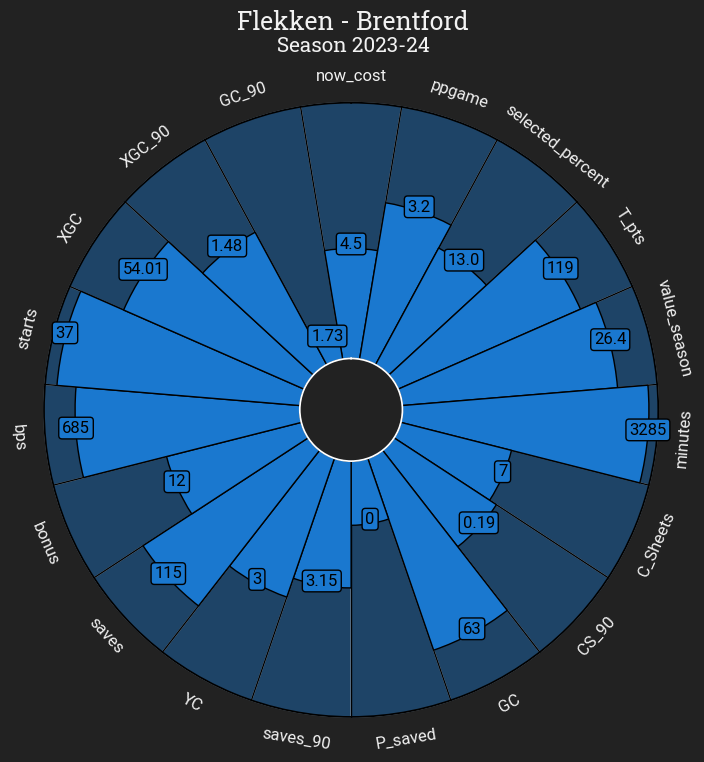

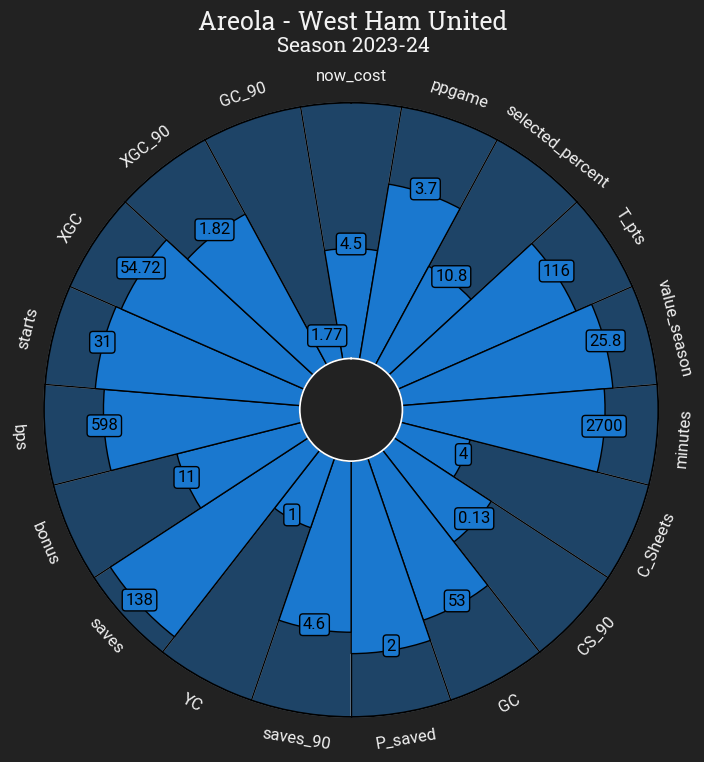

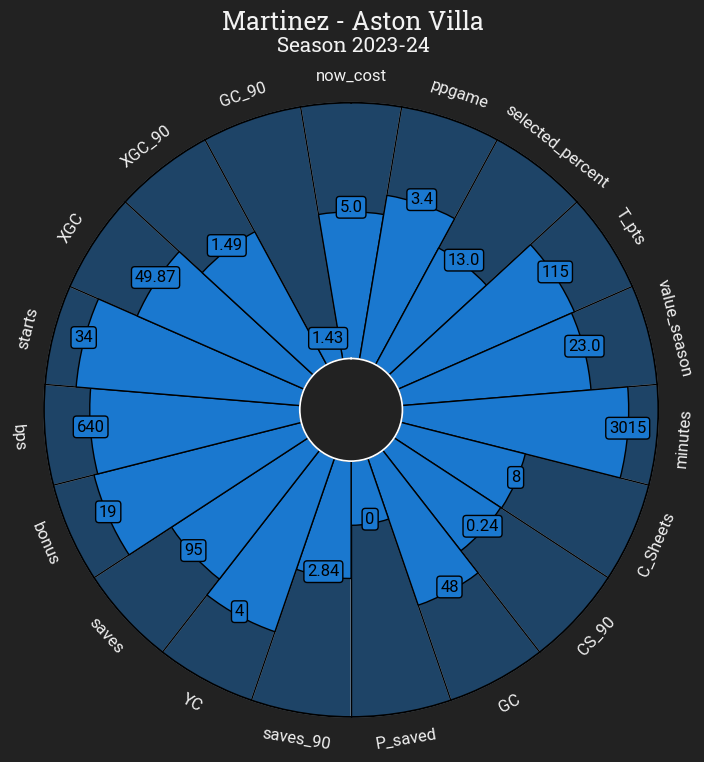

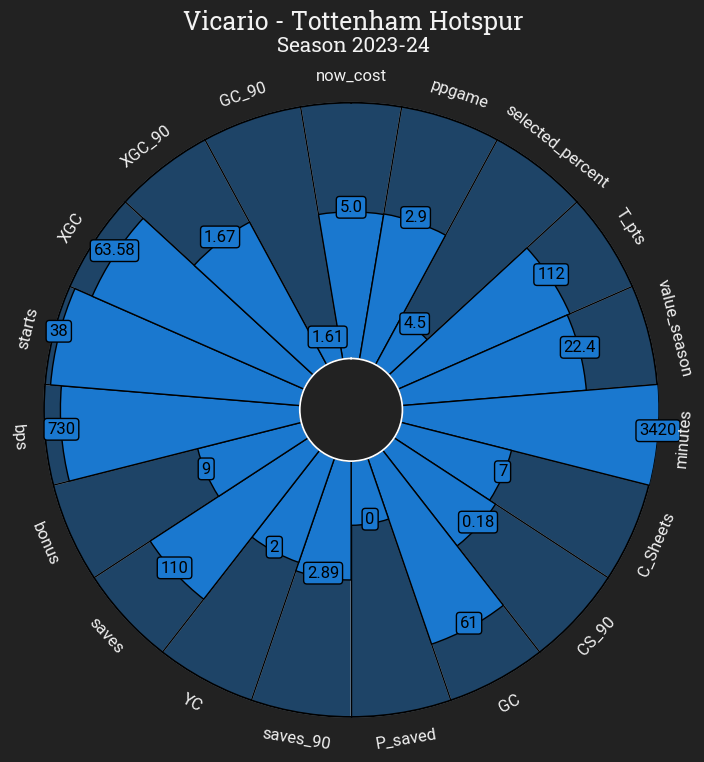

In [142]:
for i in range(8):
    pizzaplot(param2,values[i],low,high,names[i],teams[i])


## defenders

In [144]:
df['element_type'].unique()

array(['MID', 'FWD', 'DEF', 'GK'], dtype=object)

In [145]:
DEF_df=df.groupby('element_type').get_group('DEF').sort_values(by='total_points',ascending=False)

In [146]:
DEF_df.head(10)

,element_type,now_cost,points_per_game,selected_by_percent,team,total_points,value_season,web_name,minutes,goals_scored,assists,clean_sheets,goals_conceded,own_goals,penalties_saved,penalties_missed,yellow_cards,red_cards,saves,bonus,bps,influence,creativity,threat,ict_index,starts,expected_goals,expected_assists,expected_goal_involvements,expected_goals_conceded,influence_rank,influence_rank_type,creativity_rank,creativity_rank_type,threat_rank,threat_rank_type,ict_index_rank,ict_index_rank_type,corners_and_indirect_freekicks_order,direct_freekicks_order,penalties_order,expected_goals_per_90,saves_per_90,expected_assists_per_90,expected_goal_involvements_per_90,expected_goals_conceded_per_90,goals_conceded_per_90,now_cost_rank,now_cost_rank_type,form_rank,form_rank_type,points_per_game_rank,points_per_game_rank_type,selected_rank,selected_rank_type,starts_per_90,clean_sheets_per_90,Name
22,DEF,6.5,4.9,11.4,Arsenal,182,28.0,White,2987,4,5,18,26,0,0,0,8,0,0,14,776,765.8,589.4,234.0,159.0,35,1.27,3.66,4.93,24.95,42,11,51,7,136,17,64,5,NaN,NaN,NaN,0.04,0.0,0.11,0.15,0.75,0.78,47,2,535,200,17,1,38,13,1.05,0.54,Benjamin White
17,DEF,6.0,4.3,40.3,Arsenal,164,27.3,Saliba,3420,2,1,18,29,0,0,0,4,0,0,13,781,697.2,152.1,140.0,99.1,38,1.70,0.90,2.60,28.32,55,15,211,61,195,52,141,33,NaN,NaN,NaN,0.04,0.0,0.02,0.06,0.75,0.76,87,7,520,197,31,5,5,1,1.00,0.47,William Saliba
2,DEF,6.0,4.1,12.5,Arsenal,149,24.8,Gabriel,3042,3,1,16,26,1,0,0,4,0,0,8,676,675.8,121.9,379.0,117.9,34,4.48,0.65,5.13,26.18,59,18,239,73,92,4,110,21,NaN,NaN,NaN,0.13,0.0,0.02,0.15,0.77,0.77,82,6,515,196,43,6,33,10,1.01,0.47,Gabriel dos Santos Magalhães
517,DEF,5.5,3.9,32.8,Tottenham Hotspur,136,24.7,Pedro Porro,3090,3,8,7,54,0,0,0,3,0,0,20,720,839.0,877.4,365.0,208.5,35,2.92,6.18,9.10,58.42,31,6,23,4,96,6,33,1,4.0,1.0,NaN,0.09,0.0,0.18,0.27,1.70,1.57,148,17,483,191,52,9,9,3,1.02,0.20,Pedro Porro
225,DEF,5.0,3.5,6.7,Everton,124,24.8,Branthwaite,3116,3,1,12,44,0,0,0,8,0,0,10,621,789.4,67.2,185.0,104.3,35,1.62,1.29,2.91,49.43,38,10,288,101,164,33,130,29,NaN,NaN,NaN,0.05,0.0,0.04,0.09,1.43,1.27,285,39,397,179,79,15,59,21,1.01,0.35,Jarrad Branthwaite
363,DEF,6.0,4.4,33.8,Manchester City,123,20.5,Gvardiol,2327,4,2,9,23,0,0,0,3,0,0,12,549,544.4,362.2,389.0,129.7,26,3.14,2.09,5.23,23.88,101,35,105,20,89,3,94,13,NaN,NaN,NaN,0.12,0.0,0.08,0.20,0.92,0.89,91,9,524,199,27,3,8,2,1.01,0.35,Joško Gvardiol
376,DEF,5.5,3.8,9.4,Manchester City,123,22.4,Walker,2766,0,5,10,29,0,0,0,2,0,0,13,633,465.4,534.1,126.0,112.6,30,0.40,3.20,3.60,28.61,139,44,59,9,212,58,115,23,NaN,NaN,NaN,0.01,0.0,0.10,0.11,0.93,0.94,95,10,430,184,57,10,45,15,0.98,0.33,Kyle Walker
431,DEF,5.5,3.4,4.8,Newcastle United,123,22.4,Schär,3055,4,3,9,58,0,0,0,5,0,0,12,629,826.6,166.7,278.0,127.4,35,2.47,1.41,3.87,58.64,33,7,204,56,120,10,97,15,NaN,2.0,NaN,0.07,0.0,0.04,0.11,1.73,1.71,108,12,443,186,91,17,77,27,1.03,0.27,Fabian Schär
325,DEF,7.0,4.4,26.6,Liverpool,122,17.4,Alexander-Arnold,2153,3,5,8,28,0,0,0,6,0,0,19,590,601.8,1027.5,237.0,186.8,25,2.78,5.84,8.62,27.96,83,28,10,2,135,16,41,2,1.0,1.0,NaN,0.12,0.0,0.24,0.36,1.17,1.17,28,1,562,201,28,4,12,4,1.05,0.33,Trent Alexander-Arnold
196,DEF,4.5,3.2,22.0,Crystal Palace,121,26.9,Andersen,3416,2,3,10,58,0,0,0,7,0,0,12,679,873.6,301.1,253.0,143.1,38,1.75,2.08,3.83,53.71,28,3,122,24,126,11,82,10,NaN,NaN,NaN,0.05,0.0,0.05,0.10,1.42,1.53,372,79,134,87,116,25,15,5,1.00,0.26,Joachim Andersen


In [149]:
DEF_df.columns

Index(['now_cost', 'points_per_game', 'selected_by_percent', 'team',
       'total_points', 'value_season', 'web_name', 'minutes', 'goals_scored',
       'assists', 'clean_sheets', 'goals_conceded', 'own_goals',
       'penalties_missed', 'yellow_cards', 'red_cards', 'bonus', 'bps',
       'influence', 'creativity', 'threat', 'ict_index', 'starts',
       'expected_goals', 'expected_assists', 'expected_goal_involvements',
       'expected_goals_conceded', 'influence_rank', 'influence_rank_type',
       'creativity_rank', 'creativity_rank_type', 'threat_rank',
       'threat_rank_type', 'ict_index_rank', 'ict_index_rank_type',
       'corners_and_indirect_freekicks_order', 'direct_freekicks_order',
       'penalties_order', 'expected_goals_per_90', 'expected_assists_per_90',
       'expected_goal_involvements_per_90', 'expected_goals_conceded_per_90',
       'goals_conceded_per_90'],
      dtype='object')

In [148]:
DEF_df.drop(columns=['element_type','penalties_saved','saves',
       'now_cost_rank', 'now_cost_rank_type', 'form_rank', 'form_rank_type',
       'points_per_game_rank', 'points_per_game_rank_type', 'selected_rank',
       'selected_rank_type', 'starts_per_90', 'clean_sheets_per_90', 'Name','saves_per_90'],inplace=True)

In [150]:
DEF_df.describe()

,now_cost,points_per_game,selected_by_percent,total_points,value_season,minutes,goals_scored,assists,clean_sheets,goals_conceded,own_goals,penalties_missed,yellow_cards,red_cards,bonus,bps,influence,creativity,threat,ict_index,starts,expected_goals,expected_assists,expected_goal_involvements,expected_goals_conceded,influence_rank,influence_rank_type,creativity_rank,creativity_rank_type,threat_rank,threat_rank_type,ict_index_rank,ict_index_rank_type,corners_and_indirect_freekicks_order,direct_freekicks_order,penalties_order,expected_goals_per_90,expected_assists_per_90,expected_goal_involvements_per_90,expected_goals_conceded_per_90,goals_conceded_per_90
count,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.0,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,201.000000,15.000000,12.000000,0.0,201.000000,201.00000,201.000000,201.000000,201.000000
mean,4.554726,1.621891,2.486567,40.253731,8.325871,1137.592040,0.676617,0.980100,2.995025,19.507463,0.124378,0.0,2.273632,0.119403,3.074627,220.631841,257.137313,128.735821,84.009950,47.056716,12.701493,0.713035,0.782090,1.494975,19.199254,280.358209,101.000000,295.328358,101.000000,297.074627,101.000000,298.950249,101.000000,2.600000,2.166667,NaN,0.036965,0.04408,0.081045,1.059851,1.107662
std,0.516711,1.365950,5.715677,41.475780,8.125197,1104.326873,1.034360,1.661205,3.578404,19.191696,0.359795,0.0,2.649481,0.340105,4.325437,219.228839,262.754972,183.364504,99.166526,49.222830,12.499618,0.921180,1.128839,1.793111,19.102048,154.868205,58.167861,137.385595,58.167861,120.049571,58.167861,141.009211,58.167861,1.298351,1.114641,NaN,0.045412,0.06222,0.089182,0.812751,0.959781
min,4.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,21.000000,1.000000,9.000000,1.000000,70.000000,1.000000,33.000000,1.000000,1.000000,1.000000,NaN,0.000000,0.00000,0.000000,0.000000,0.000000
25%,4.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,149.000000,51.000000,195.000000,51.000000,192.000000,51.000000,184.000000,51.000000,1.000000,1.000000,NaN,0.000000,0.00000,0.000000,0.000000,0.000000
50%,4.500000,1.800000,0.400000,34.000000,7.600000,949.000000,0.000000,0.000000,2.000000,16.000000,0.000000,0.0,1.000000,0.000000,1.000000,199.000000,195.200000,67.200000,41.000000,38.700000,10.000000,0.320000,0.380000,0.960000,15.260000,274.000000,101.000000,288.000000,101.000000,296.000000,101.000000,286.000000,101.000000,3.000000,2.000000,NaN,0.030000,0.02000,0.070000,1.400000,1.350000
75%,4.500000,2.700000,1.900000,69.000000,14.700000,2020.000000,1.000000,1.000000,5.000000,33.000000,0.000000,0.0,4.000000,0.000000,4.000000,375.000000,439.400000,176.300000,143.000000,79.300000,23.000000,1.130000,1.070000,2.380000,31.510000,429.000000,151.000000,419.000000,151.000000,395.000000,151.000000,432.000000,151.000000,4.000000,3.000000,NaN,0.060000,0.06000,0.120000,1.690000,1.730000
max,7.000000,4.900000,40.300000,182.000000,28.000000,3420.000000,5.000000,10.000000,18.000000,70.000000,2.000000,0.0,13.000000,2.000000,20.000000,781.000000,915.400000,1028.500000,449.000000,208.500000,38.000000,4.480000,6.970000,9.100000,69.090000,589.000000,201.000000,589.000000,201.000000,589.000000,201.000000,589.000000,201.000000,4.000000,4.000000,NaN,0.330000,0.48000,0.510000,3.240000,6.000000


In [166]:
def pizza_plot(ax, params, values, min_range, max_range, name, team):
    baker = PyPizza(
        params=params,
        min_range=min_range,  # min range values
        max_range=max_range,  # max range values
        background_color="#222222", straight_line_color="#000000",
        last_circle_color="#000000", last_circle_lw=2.5, straight_line_lw=1,
        other_circle_lw=0, other_circle_color="#000000", inner_circle_size=20,
    )

    # plot pizza
    fig, _ = baker.make_pizza(
        values,  # list of values
        figsize=(8, 8),  # adjust figsize according to your need
        color_blank_space="same",  # use same color to fill blank space
        blank_alpha=0.4,  # alpha for blank-space colors
        param_location=110,  # where the parameters will be added
        kwargs_slices=dict(
            facecolor="#1A78CF", edgecolor="#000000",
            zorder=1, linewidth=1,
        ),  # values to be used when plotting slices
        kwargs_params=dict(
            color="#F2F2F2", fontsize=12, zorder=5,
            fontproperties=font_normal.prop, va="center"
        ),  # values to be used when adding parameter
        kwargs_values=dict(
            color="#000000", fontsize=12,
            fontproperties=font_normal.prop, zorder=3,
            bbox=dict(
                edgecolor="#000000", facecolor="#1A78CF",
                boxstyle="round,pad=0.2", lw=1
            )
        )  # values to be used when adding parameter-values
    )

    # Add title and subtitle on the specified axis
    ax.text(
        0.515, 1.02, f"{name} - {team}", size=18,
        ha="center", fontproperties=font_bold.prop, color="#F2F2F2"
    )
    ax.text(
        0.515, 0.98,
        "Season 2023-24",
        size=15,
        ha="center", fontproperties=font_bold.prop, color="#F2F2F2"
    )
    CREDIT_1 = "data: statsbomb"
    CREDIT_2 = "inspired by: youssef alarby"

    ax.text(
        0.99, -0.1, f"{CREDIT_1}\n{CREDIT_2}", size=9,
        fontproperties=font_italic.prop, color="#F2F2F2",
        ha="right"
    )
    
    # Hide axes
    #ax.set_xticks([])
    #ax.set_yticks([])
    #ax.set_xlim(0, 1)
    #ax.set_ylim(0, 1)
    #ax.spines['polar'].set_visible(False)
    
    plt.subplots_adjust(wspace=0.3, hspace=0.4)


In [152]:
DEF_df.columns

Index(['now_cost', 'points_per_game', 'selected_by_percent', 'team',
       'total_points', 'value_season', 'web_name', 'minutes', 'goals_scored',
       'assists', 'clean_sheets', 'goals_conceded', 'own_goals',
       'penalties_missed', 'yellow_cards', 'red_cards', 'bonus', 'bps',
       'influence', 'creativity', 'threat', 'ict_index', 'starts',
       'expected_goals', 'expected_assists', 'expected_goal_involvements',
       'expected_goals_conceded', 'influence_rank', 'influence_rank_type',
       'creativity_rank', 'creativity_rank_type', 'threat_rank',
       'threat_rank_type', 'ict_index_rank', 'ict_index_rank_type',
       'corners_and_indirect_freekicks_order', 'direct_freekicks_order',
       'penalties_order', 'expected_goals_per_90', 'expected_assists_per_90',
       'expected_goal_involvements_per_90', 'expected_goals_conceded_per_90',
       'goals_conceded_per_90'],
      dtype='object')

In [153]:
len(param)

19

In [169]:
params_def=['now_cost', 'points_per_game', 'selected_by_percent',
       'total_points', 'value_season', 'minutes', 'goals_scored',
       'assists', 'clean_sheets', 'goals_conceded', 'own_goals','yellow_cards', 'red_cards', 'bonus', 'bps',
       'influence', 'creativity', 'threat', 'ict_index', 'starts',
       'expected_goals', 'expected_assists', 'expected_goal_involvements',
       'expected_goals_per_90', 'expected_assists_per_90',
       'expected_goal_involvements_per_90']

param2_def=['cost', 'pts_game', 'selected%',
       'total_pts', 'value_season', 'minutes', 'G',
       'A', 'clean_sheets', 'GC', 'own_G','YC', 'RD', 'bonus', 'bps',
       'I', 'C', 'T', 'ict_i', 'starts',
       'XG', 'XA', 'XGI',
       'XG_90', 'XA_90',
       'XGI_90']
low_is_better_def=['cost','GC','own_G','YC', 'RD']


In [164]:
low,high=find_low_high(DEF_df,params_def)

In [170]:
values,names,teams=prepare_data(DEF_df,params_def,15)

In [159]:
names

['White',
 'Saliba',
 'Gabriel',
 'Pedro Porro',
 'Branthwaite',
 'Gvardiol',
 'Walker',
 'Schär',
 'Alexander-Arnold',
 'Andersen',
 'Mitchell',
 'Virgil',
 'Tarkowski',
 'Akanji',
 'Trippier']

In [172]:
def plot_all_players(values, params, min_range, max_range, teams,names):
    num_players = len(names)
    num_cols = 5  # Number of columns in the grid
    num_rows = (num_players + num_cols - 1) // num_cols  # Number of rows needed
    
    #fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 8, num_rows * 8))
    #axes = axes.flatten()  # Flatten the 2D array of axes for easy iteration
    
    for i in range(num_players):
        player_data = values[i]
        name = names[i]  # Adjust according to your data structure
        team = teams[i]  # Adjust according to your data structure
        pizzaplot(params, player_data, min_range, max_range, name, team)
    
    # Turn off any unused subplots
    #for j in range(i + 1, len(axes)):
        #fig.delaxes(axes[j])
    
    #plt.tight_layout()
    plt.show()

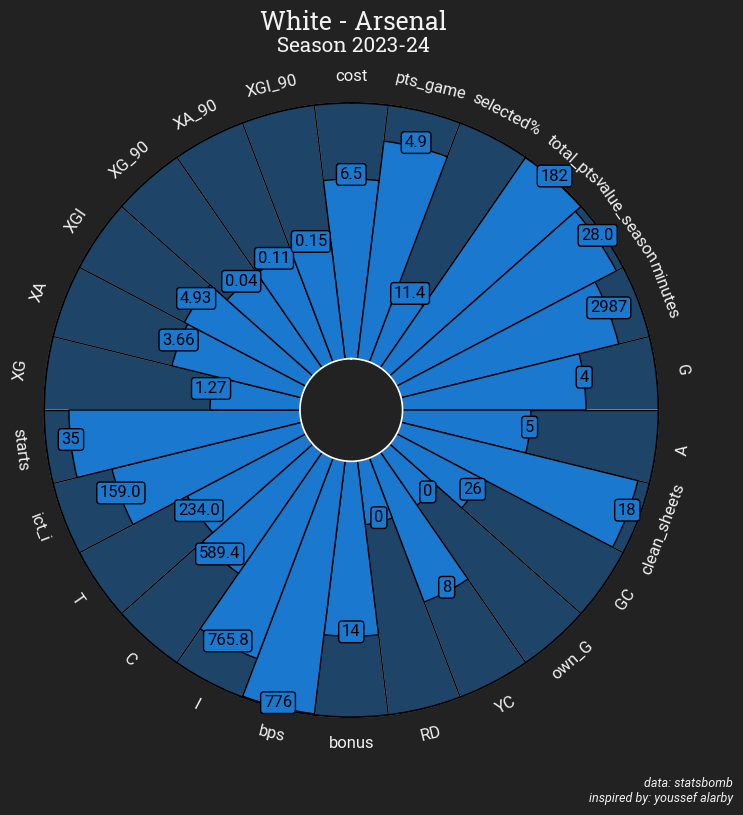

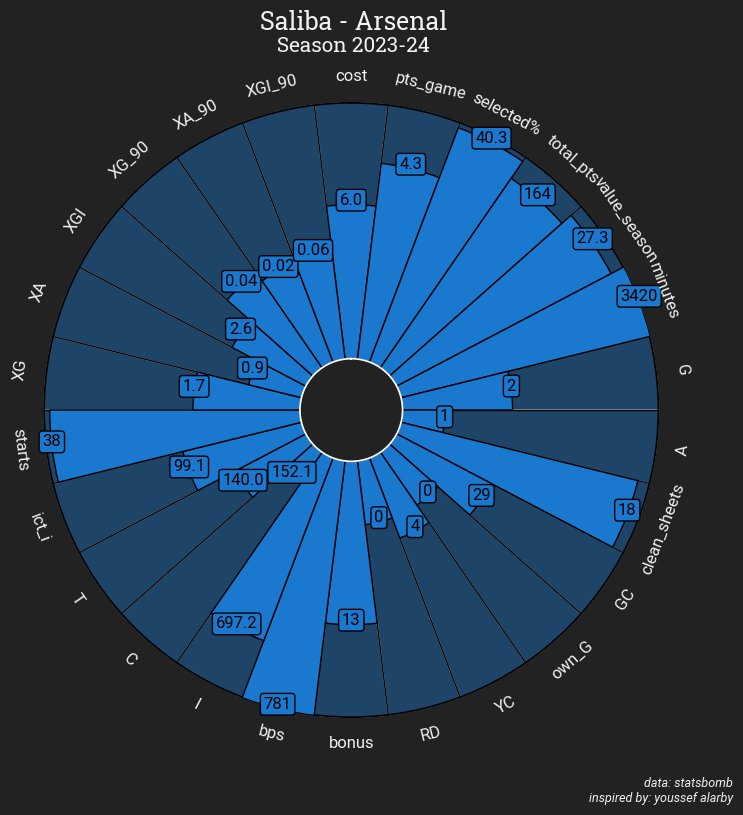

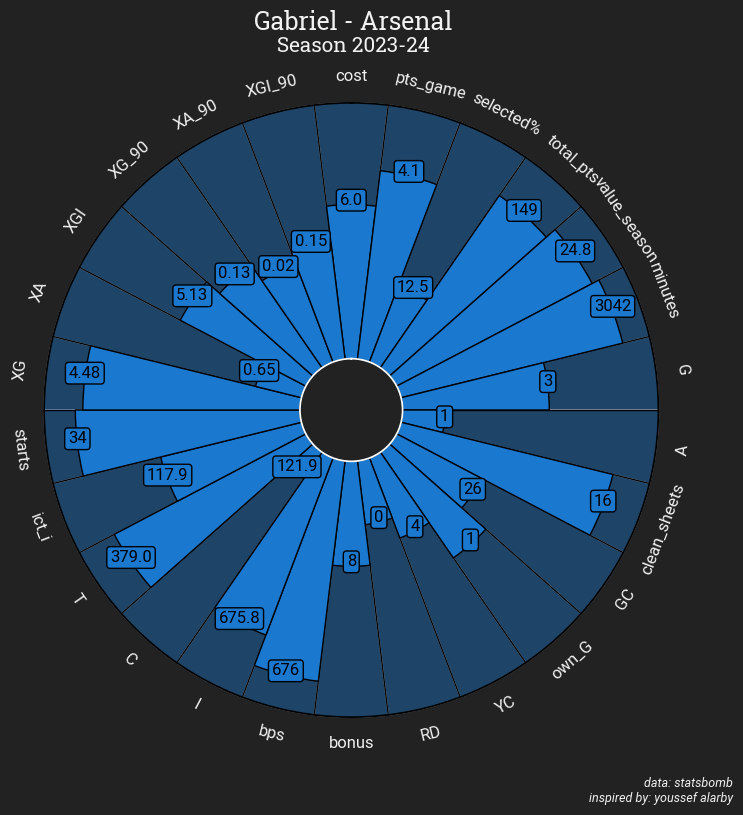

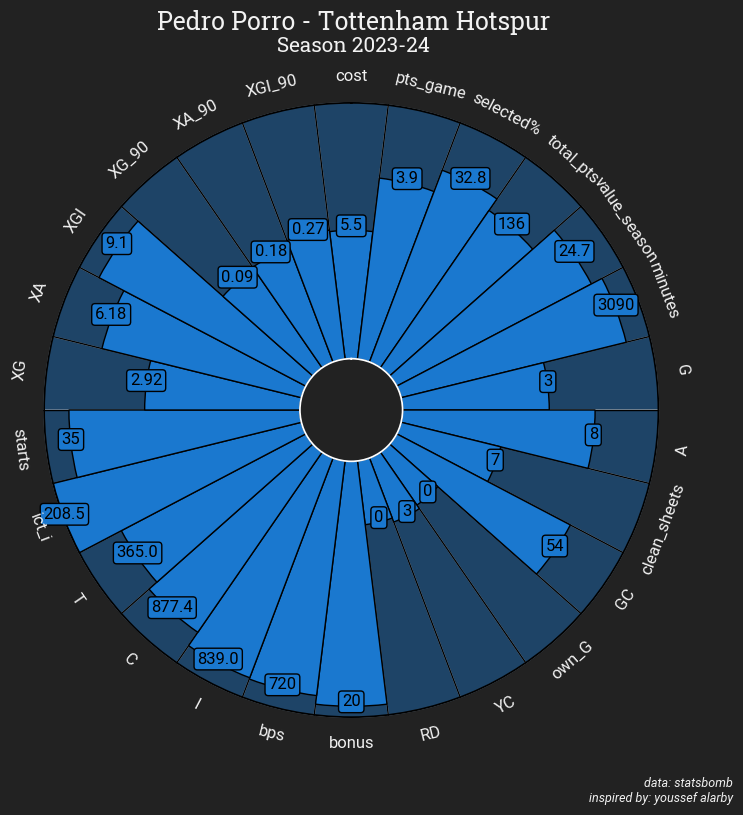

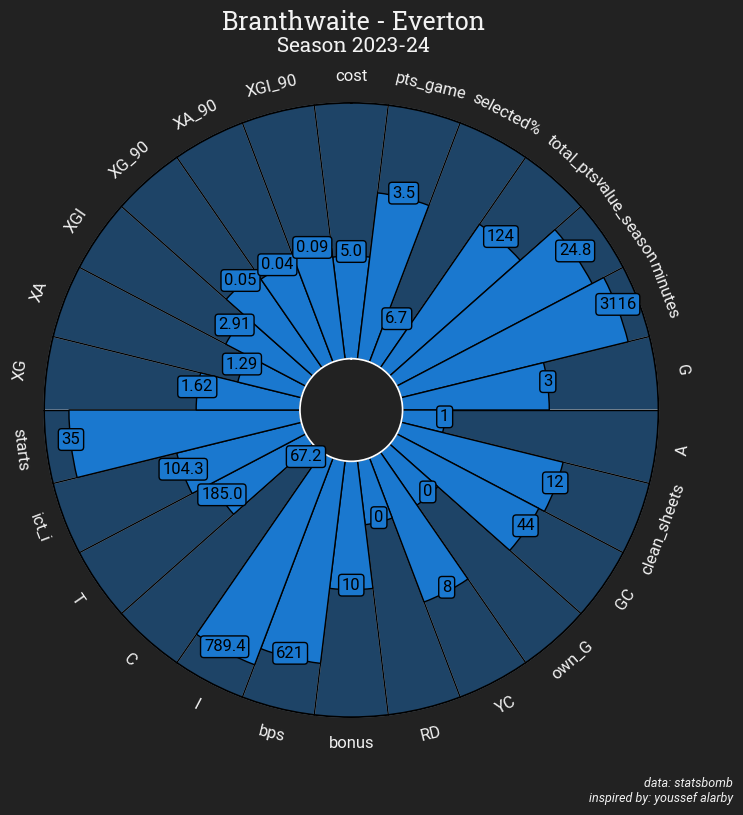

...

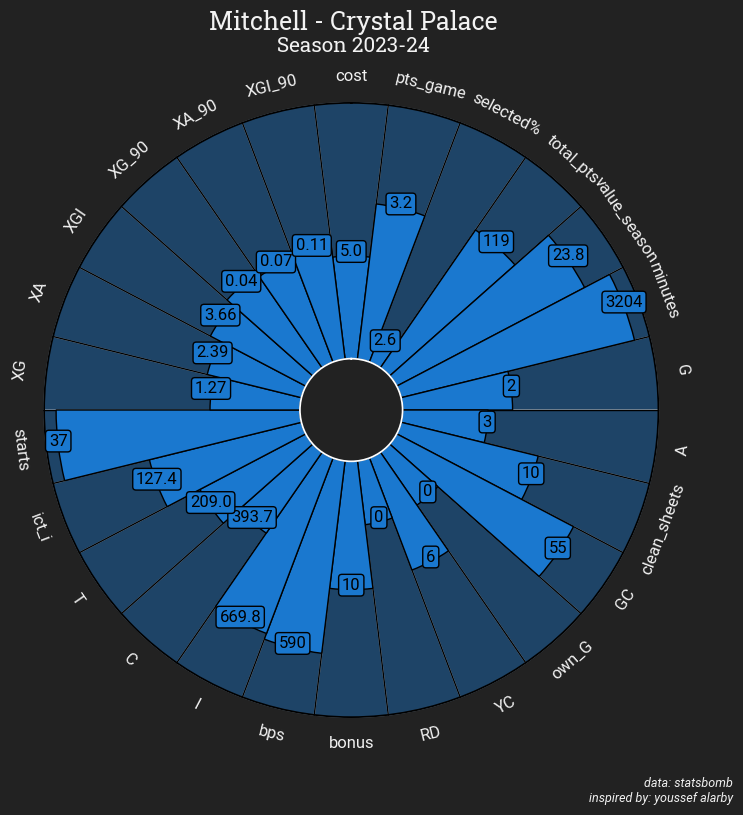

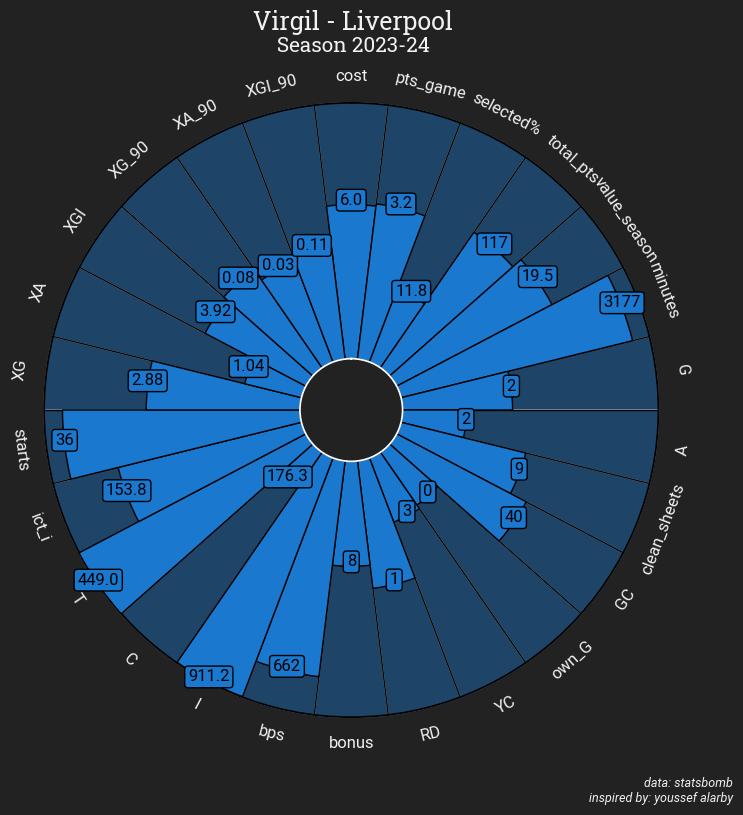

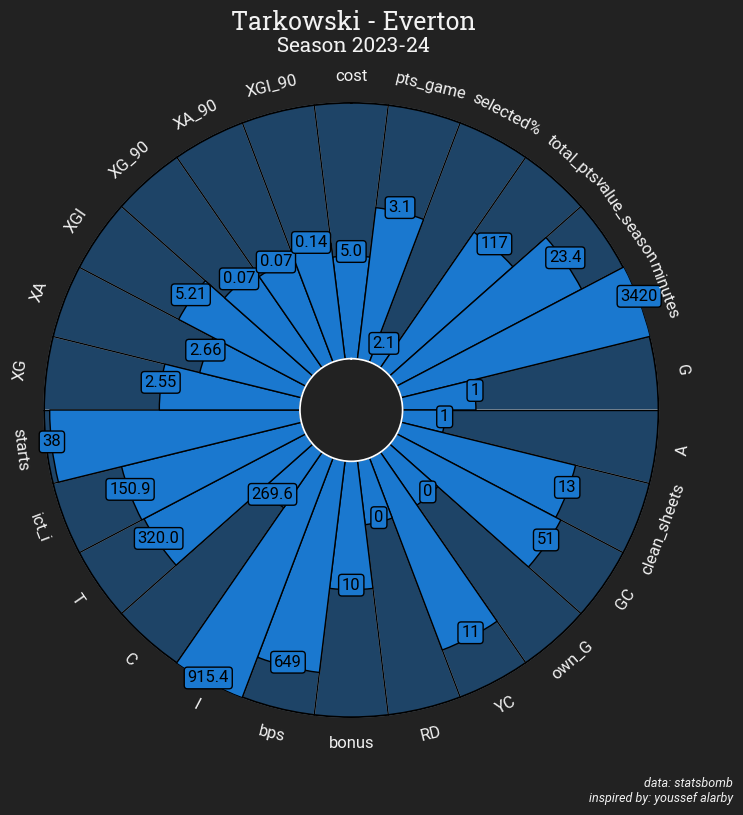

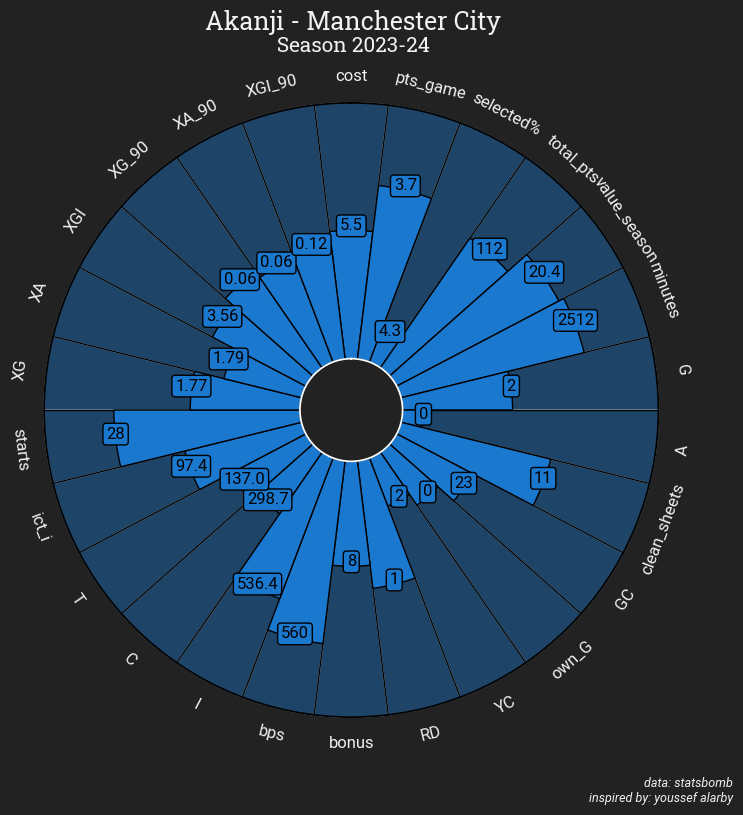

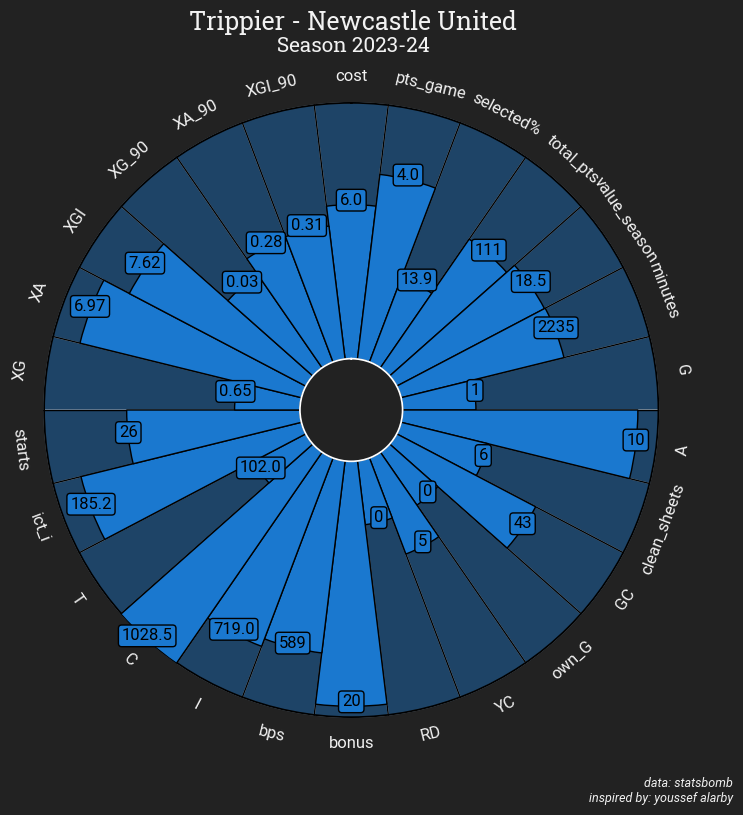

<Figure size 640x480 with 0 Axes>

In [174]:
plot_all_players(values,param2_def,low,high,teams,names)

<Axes: xlabel='now_cost', ylabel='Count'>

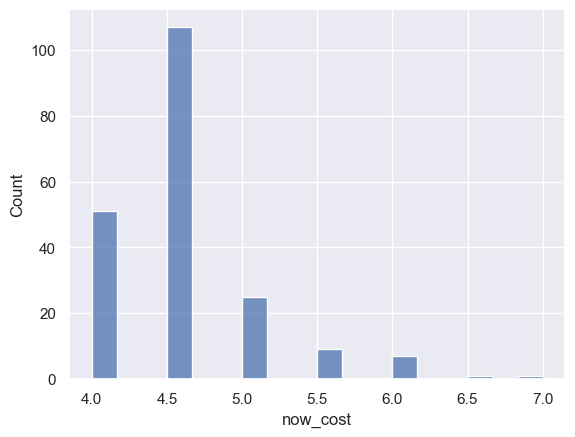

In [179]:
sns.histplot(DEF_df['now_cost'])

In [191]:
DEF_df[DEF_df['now_cost'] < 5.0].head()

,now_cost,points_per_game,selected_by_percent,team,total_points,value_season,web_name,minutes,goals_scored,assists,clean_sheets,goals_conceded,own_goals,penalties_missed,yellow_cards,red_cards,bonus,bps,influence,creativity,threat,ict_index,starts,expected_goals,expected_assists,expected_goal_involvements,expected_goals_conceded,influence_rank,influence_rank_type,creativity_rank,creativity_rank_type,threat_rank,threat_rank_type,ict_index_rank,ict_index_rank_type,corners_and_indirect_freekicks_order,direct_freekicks_order,penalties_order,expected_goals_per_90,expected_assists_per_90,expected_goal_involvements_per_90,expected_goals_conceded_per_90,goals_conceded_per_90
196,4.5,3.2,22.0,Crystal Palace,121,26.9,Andersen,3416,2,3,10,58,0,0,7,0,12,679,873.6,301.1,253.0,143.1,38,1.75,2.08,3.83,53.71,28,3,122,24,126,11,82,10,NaN,NaN,NaN,0.05,0.05,0.10,1.42,1.53
252,4.5,3.1,3.3,Fulham,105,23.3,Castagne,2630,1,3,9,40,0,0,3,0,7,510,494.4,295.0,229.0,102.1,29,1.29,2.06,3.35,41.07,127,40,125,27,139,19,135,30,NaN,NaN,NaN,0.04,0.07,0.11,1.41,1.37
263,4.5,2.8,7.7,Fulham,104,23.1,Robinson,3266,0,6,9,60,2,0,6,0,8,662,805.8,536.7,241.0,158.6,37,0.68,3.75,4.43,61.93,36,9,58,8,132,15,65,6,NaN,NaN,NaN,0.02,0.10,0.12,1.71,1.65
237,4.5,3.6,11.3,Everton,101,22.4,Mykolenko,2469,2,1,9,37,0,0,1,0,9,452,517.4,239.8,211.0,96.8,28,1.49,1.07,2.56,39.97,116,38,158,35,151,28,147,37,NaN,NaN,NaN,0.05,0.04,0.09,1.46,1.35
411,4.5,2.9,18.5,Newcastle United,97,21.6,Burn,2725,2,2,8,45,0,0,4,0,4,493,656.4,153.8,286.0,109.7,32,3.35,1.12,4.47,46.22,67,21,210,60,117,8,120,25,NaN,NaN,NaN,0.11,0.04,0.15,1.53,1.49


In [192]:
values,names,teams=prepare_data(DEF_df[DEF_df['now_cost'] < 5.0],params_def,7)

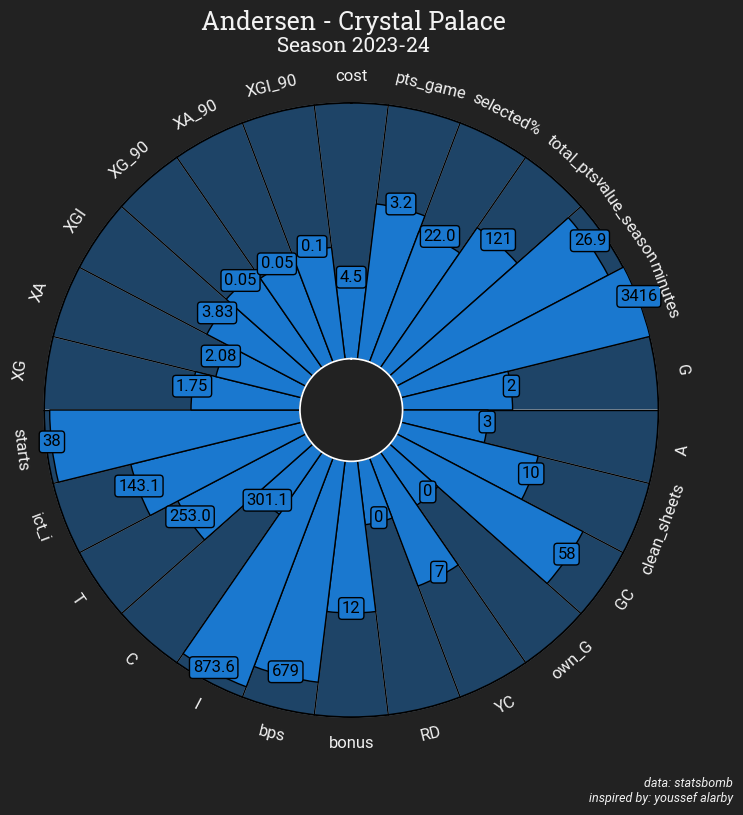

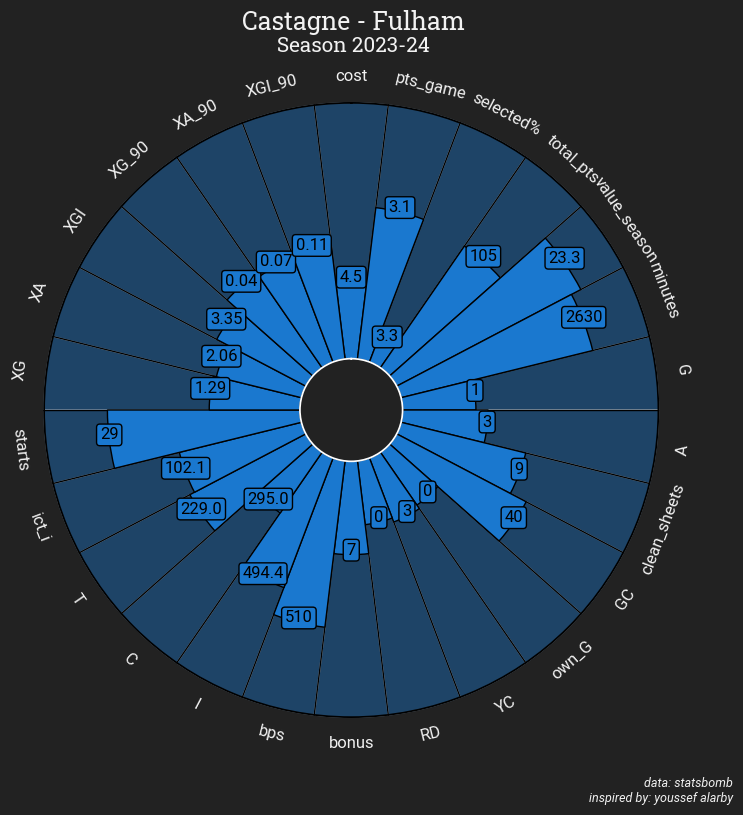

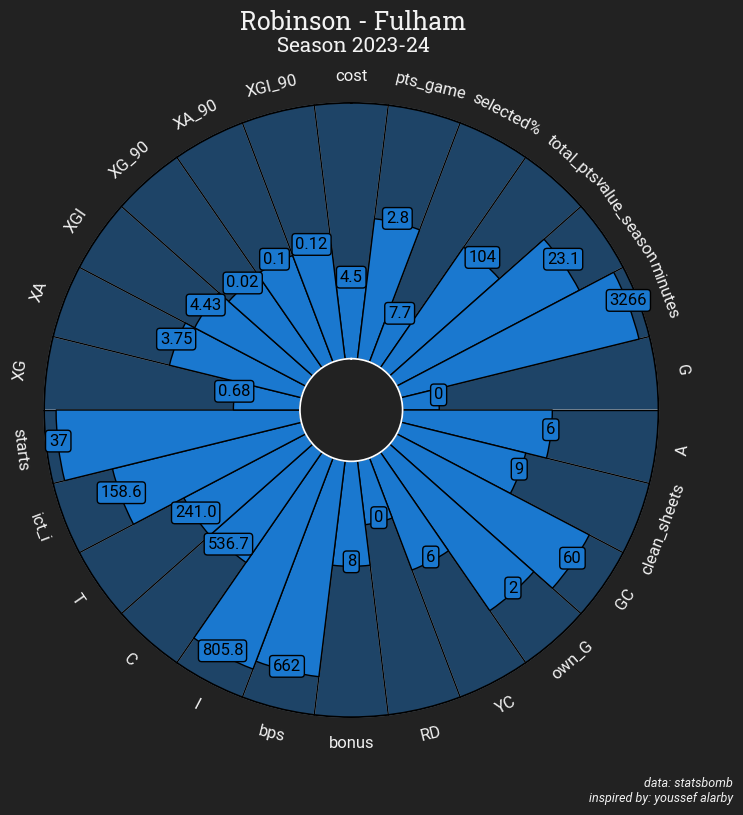

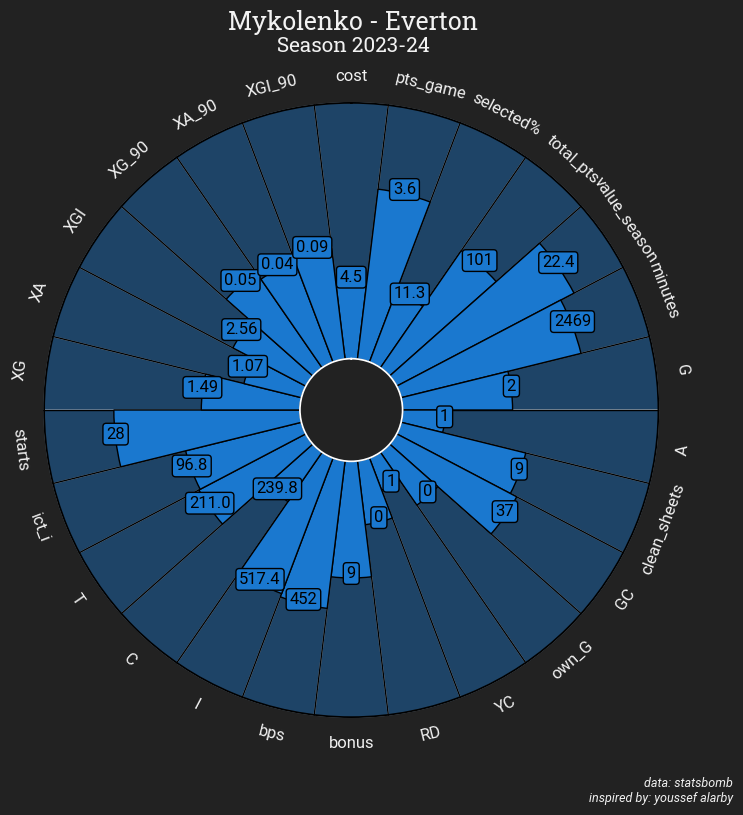

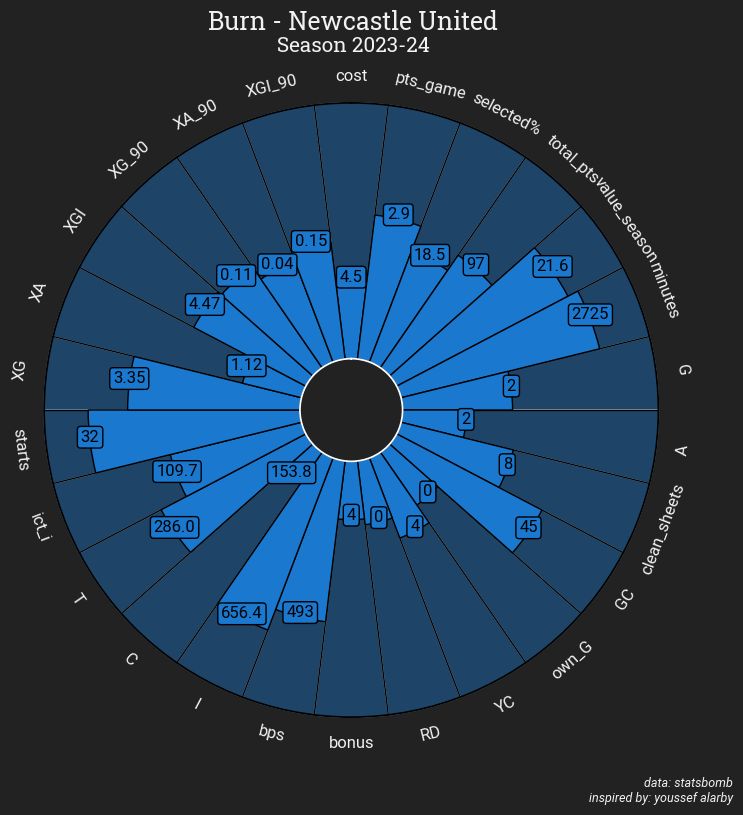

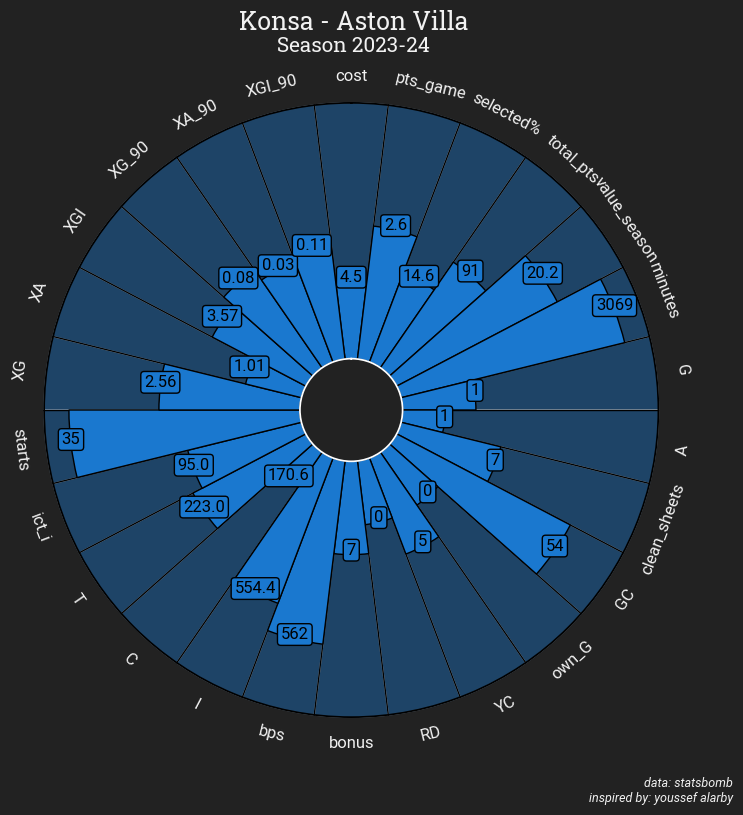

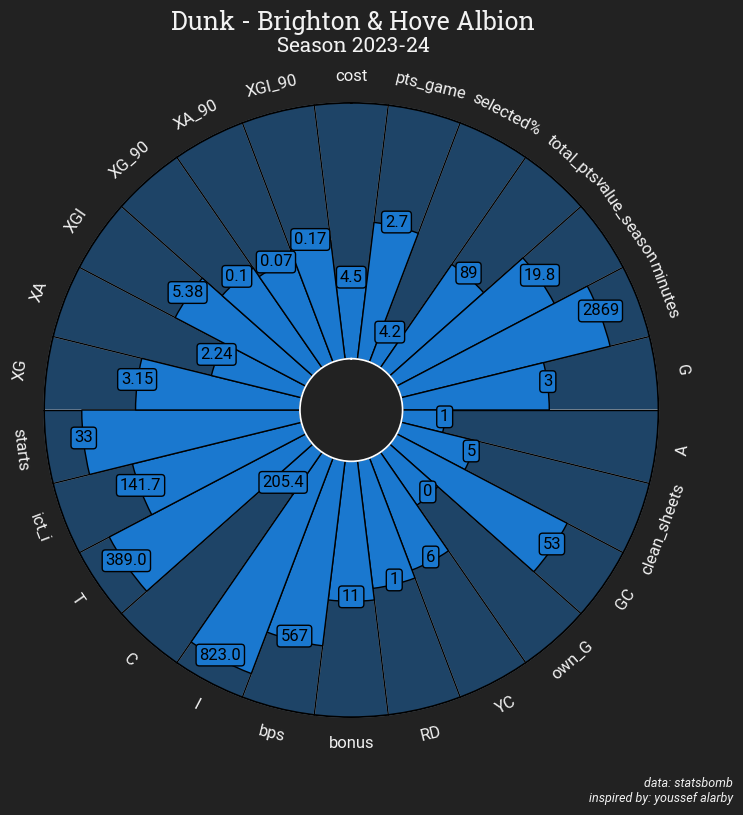

In [193]:
plot_all_players(values,param2_def,low,high,teams,names)

## MID

In [175]:
df['element_type'].unique()

array(['MID', 'FWD', 'DEF', 'GK'], dtype=object)

In [176]:
MID_df=df.groupby('element_type').get_group('MID').sort_values(by='total_points',ascending=False)

In [177]:
MID_df.head(10)

,element_type,now_cost,points_per_game,selected_by_percent,team,total_points,value_season,web_name,minutes,goals_scored,assists,clean_sheets,goals_conceded,own_goals,penalties_saved,penalties_missed,yellow_cards,red_cards,saves,bonus,bps,influence,creativity,threat,ict_index,starts,expected_goals,expected_assists,expected_goal_involvements,expected_goals_conceded,influence_rank,influence_rank_type,creativity_rank,creativity_rank_type,threat_rank,threat_rank_type,ict_index_rank,ict_index_rank_type,corners_and_indirect_freekicks_order,direct_freekicks_order,penalties_order,expected_goals_per_90,saves_per_90,expected_assists_per_90,expected_goal_involvements_per_90,expected_goals_conceded_per_90,goals_conceded_per_90,now_cost_rank,now_cost_rank_type,form_rank,form_rank_type,points_per_game_rank,points_per_game_rank_type,selected_rank,selected_rank_type,starts_per_90,clean_sheets_per_90,Name
184,MID,10.5,7.2,41.5,Chelsea,244,23.2,Palmer,2617,22,13,7,46,0,0,0,7,0,0,32,844,1240.2,1022.5,1016.0,327.8,29,17.35,8.17,25.52,45.48,1,1,12,10,15,8,5,5,2.0,1.0,1.0,0.60,0.0,0.28,0.88,1.56,1.58,3,2,592,258,1,1,4,1,1.00,0.24,Cole Palmer
361,MID,9.5,6.6,21.5,Manchester City,230,24.2,Foden,2860,19,8,14,27,0,0,0,2,0,0,31,866,1154.8,1157.8,1172.0,348.8,33,10.17,6.95,17.12,28.51,3,2,6,6,8,4,3,3,3.0,NaN,NaN,0.32,0.0,0.22,0.54,0.90,0.85,7,6,589,255,3,2,16,6,1.04,0.44,Phil Foden
16,MID,10.0,6.5,28.5,Arsenal,226,22.6,Saka,2922,16,12,16,27,0,0,0,4,0,0,29,776,1093.8,1319.8,1342.0,375.7,35,15.40,10.90,26.29,25.66,6,4,4,4,5,2,1,1,1.0,NaN,1.0,0.47,0.0,0.34,0.81,0.79,0.83,5,4,591,257,5,4,11,5,1.08,0.49,Bukayo Saka
525,MID,10.0,6.1,10.5,Tottenham Hotspur,213,21.3,Son,2934,17,10,8,51,1,0,0,1,0,0,25,707,993.2,921.9,1131.0,304.7,34,11.49,7.87,19.36,53.77,13,7,19,15,9,5,8,8,NaN,NaN,1.0,0.35,0.0,0.24,0.59,1.65,1.56,4,3,590,256,7,5,43,14,1.04,0.25,Son Heung-min
341,MID,12.5,6.6,34.5,Liverpool,211,16.9,M.Salah,2531,18,12,8,30,0,0,2,2,0,0,24,621,1033.8,892.2,1531.0,346.0,28,20.89,7.47,28.36,32.22,9,6,22,18,2,1,4,4,NaN,4.0,2.0,0.74,0.0,0.27,1.01,1.15,1.07,2,1,593,259,4,3,6,2,1.00,0.28,Mohamed Salah
12,MID,8.5,5.3,16.5,Arsenal,186,21.9,Ødegaard,3098,8,11,19,23,0,0,0,2,0,0,26,703,910.4,1499.4,757.0,317.0,35,7.53,10.16,17.69,25.26,23,11,3,3,29,14,6,6,3.0,1.0,2.0,0.22,0.0,0.30,0.52,0.73,0.67,10,8,585,253,12,9,24,9,1.02,0.55,Martin Ødegaard
414,MID,7.5,5.2,29.7,Newcastle United,183,24.4,Gordon,2896,11,16,12,48,0,0,0,10,1,0,14,594,822.6,843.7,905.0,256.7,34,10.03,5.40,15.42,51.73,35,14,25,20,19,10,15,11,NaN,NaN,3.0,0.31,0.0,0.17,0.48,1.61,1.49,19,12,578,250,14,11,10,4,1.06,0.37,Anthony Gordon
537,MID,7.5,5.4,7.4,West Ham United,182,24.3,Bowen,3020,16,6,5,63,0,0,0,2,0,0,14,519,890.4,463.8,1130.0,247.8,34,11.96,4.90,16.86,62.39,25,12,70,52,10,6,16,12,2.0,NaN,4.0,0.36,0.0,0.15,0.51,1.86,1.88,16,10,575,248,10,7,52,18,1.01,0.15,Jarrod Bowen
380,MID,8.5,4.7,16.6,Manchester United,166,19.5,B.Fernandes,3118,10,9,7,52,0,0,1,9,0,0,24,729,1101.6,1663.0,748.0,351.3,35,9.73,10.23,19.96,63.99,4,3,2,2,33,17,2,2,2.0,1.0,1.0,0.28,0.0,0.30,0.58,1.85,1.50,9,7,584,252,23,15,23,8,1.01,0.20,Bruno Borges Fernandes
15,MID,6.5,4.3,6.1,Arsenal,165,25.4,Rice,3225,7,9,17,28,0,0,0,5,0,0,17,744,959.4,745.3,451.0,215.9,37,3.53,5.09,8.62,27.08,19,10,31,26,69,45,30,22,2.0,2.0,NaN,0.10,0.0,0.14,0.24,0.76,0.78,49,29,537,221,34,19,64,22,1.03,0.47,Declan Rice


<Axes: xlabel='total_points', ylabel='Count'>

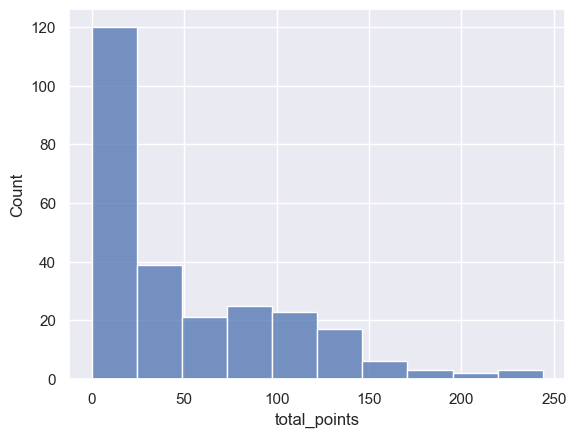

In [178]:
sns.histplot(MID_df['total_points'])

In [194]:
MID_df.columns

Index(['element_type', 'now_cost', 'points_per_game', 'selected_by_percent',
       'team', 'total_points', 'value_season', 'web_name', 'minutes',
       'goals_scored', 'assists', 'clean_sheets', 'goals_conceded',
       'own_goals', 'penalties_saved', 'penalties_missed', 'yellow_cards',
       'red_cards', 'saves', 'bonus', 'bps', 'influence', 'creativity',
       'threat', 'ict_index', 'starts', 'expected_goals', 'expected_assists',
       'expected_goal_involvements', 'expected_goals_conceded',
       'influence_rank', 'influence_rank_type', 'creativity_rank',
       'creativity_rank_type', 'threat_rank', 'threat_rank_type',
       'ict_index_rank', 'ict_index_rank_type',
       'corners_and_indirect_freekicks_order', 'direct_freekicks_order',
       'penalties_order', 'expected_goals_per_90', 'saves_per_90',
       'expected_assists_per_90', 'expected_goal_involvements_per_90',
       'expected_goals_conceded_per_90', 'goals_conceded_per_90',
       'now_cost_rank', 'now_cost_rank

In [195]:
param_MID=['now_cost', 'points_per_game', 'selected_by_percent',
       'total_points', 'value_season', 'minutes',
       'goals_scored', 'assists','penalties_missed', 'yellow_cards',
       'red_cards', 'bonus', 'bps', 'influence', 'creativity',
       'threat', 'ict_index', 'starts', 'expected_goals', 'expected_assists',
       'expected_goal_involvements', 'expected_goals_per_90',
       'expected_assists_per_90', 'expected_goal_involvements_per_90']
param_MID2=['cost', 'pts_game', 'selected%', 
      'total_pts', 'val_ssn', 'minutes',
       'G', 'A','pnlty_missed', 'YC',
       'RC', 'bonus', 'bps', 'I', 'C',
       'T', 'I_idx', 'starts', 'XG', 'XA',
       'XGI', 'XG90',
       'XA90', 'XGI90']

In [196]:
len(param_MID)==len(param_MID2)

True

In [199]:
low,high=find_low_high(MID_df,param_MID)

In [201]:
values,names,teams=prepare_data(MID_df,param_MID,15)

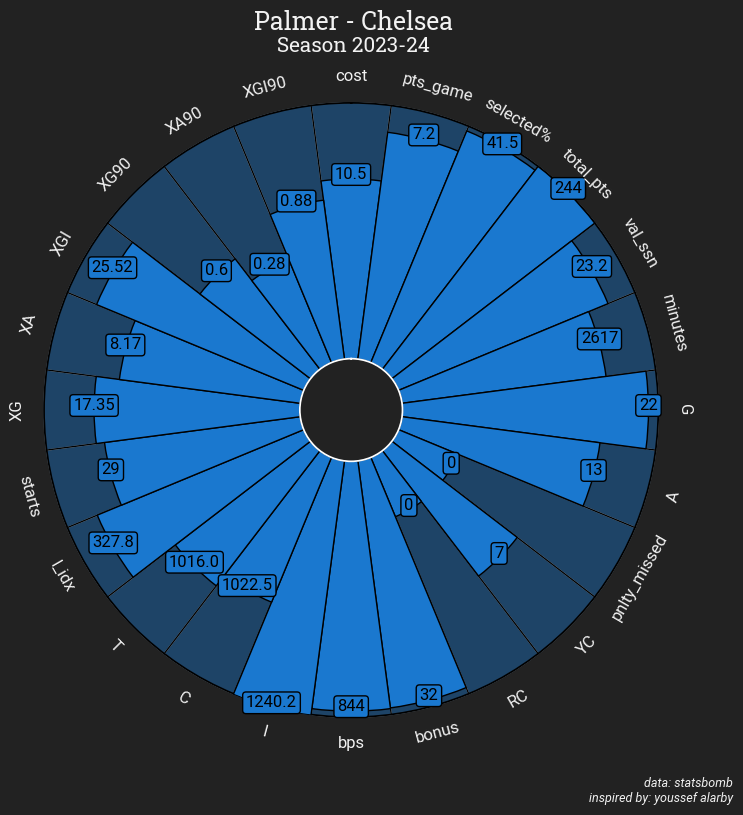

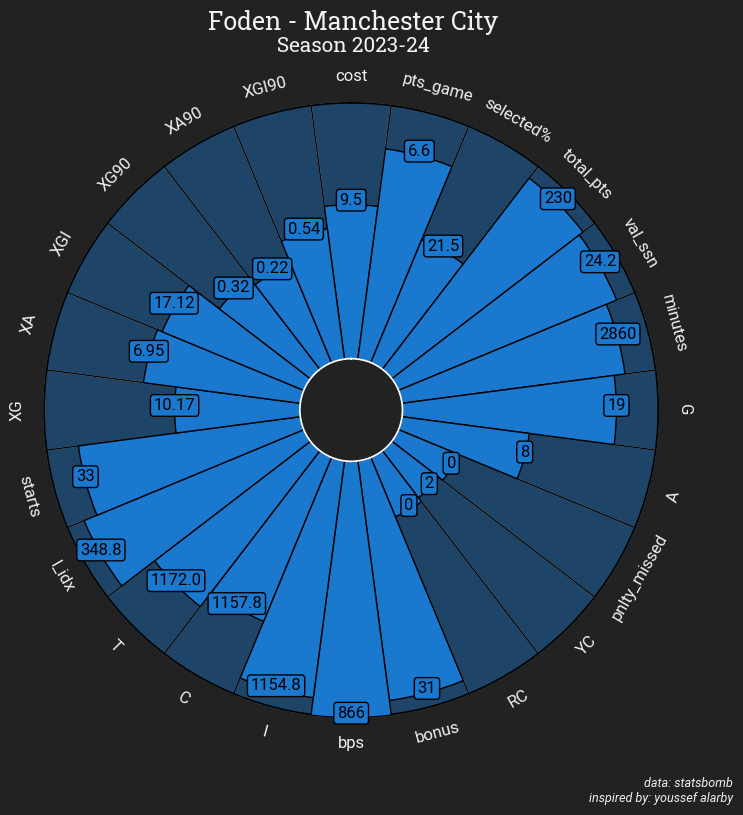

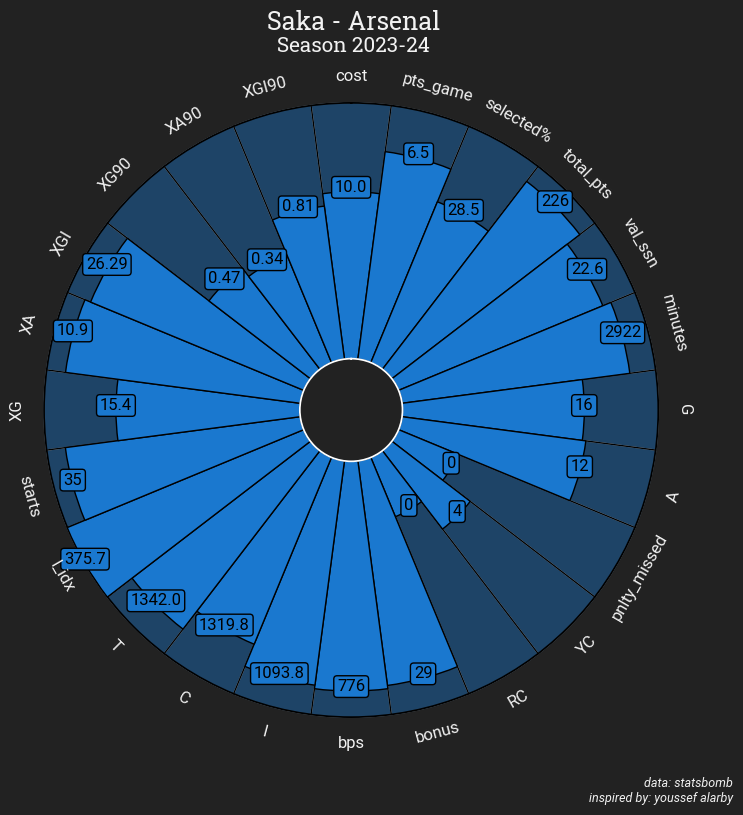

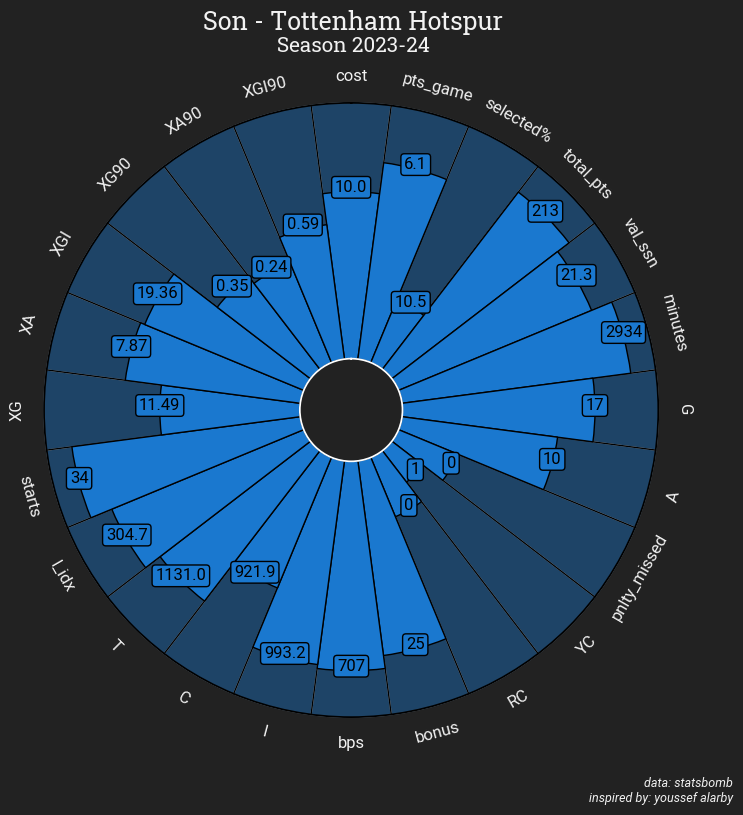

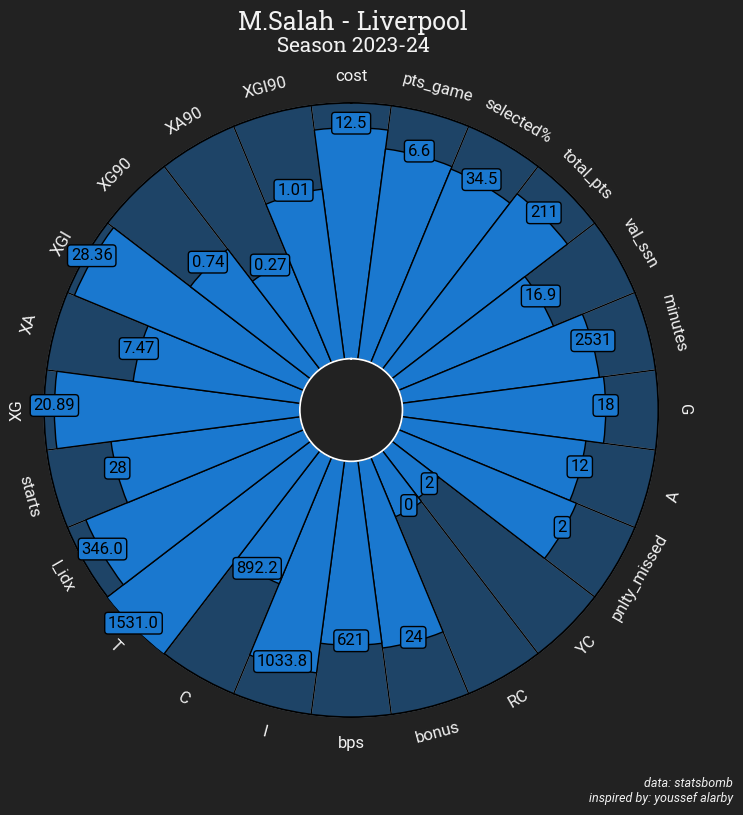

...

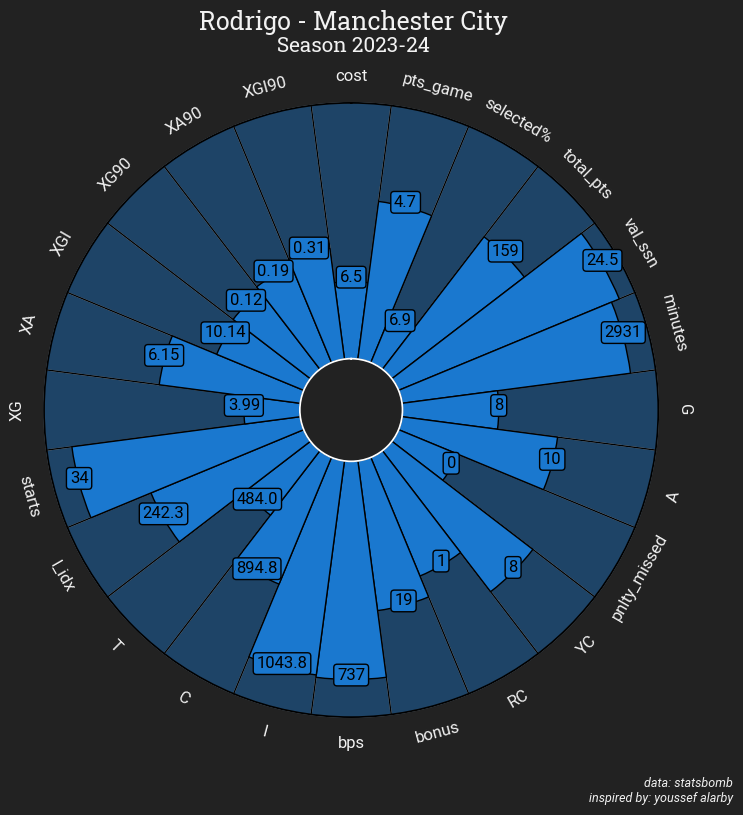

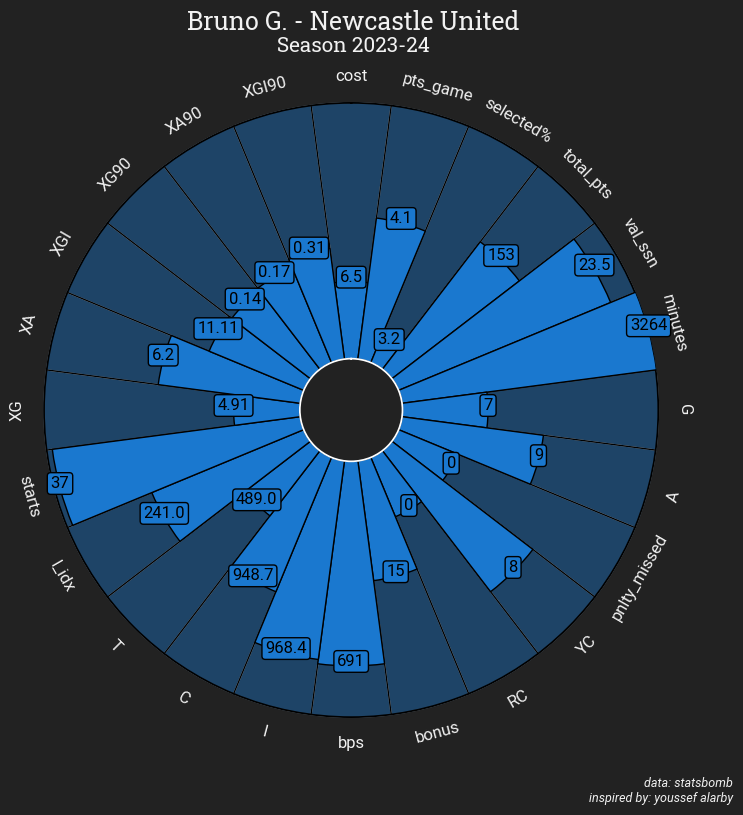

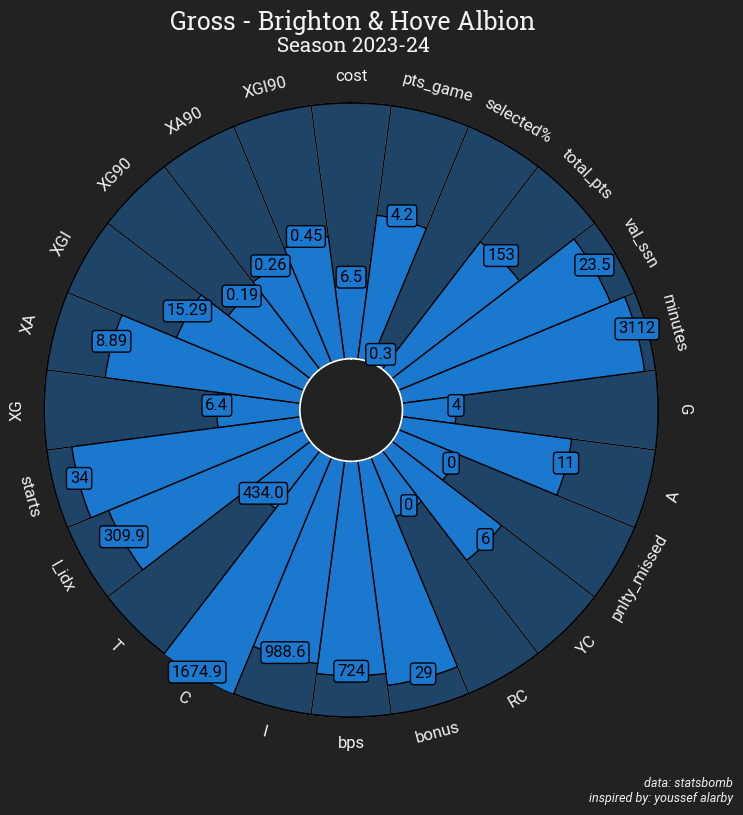

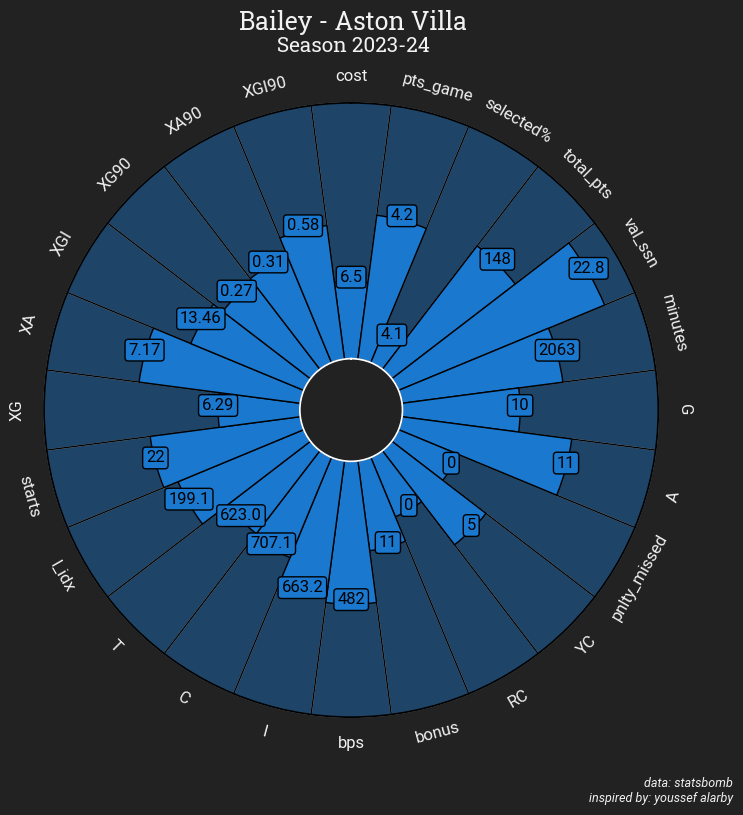

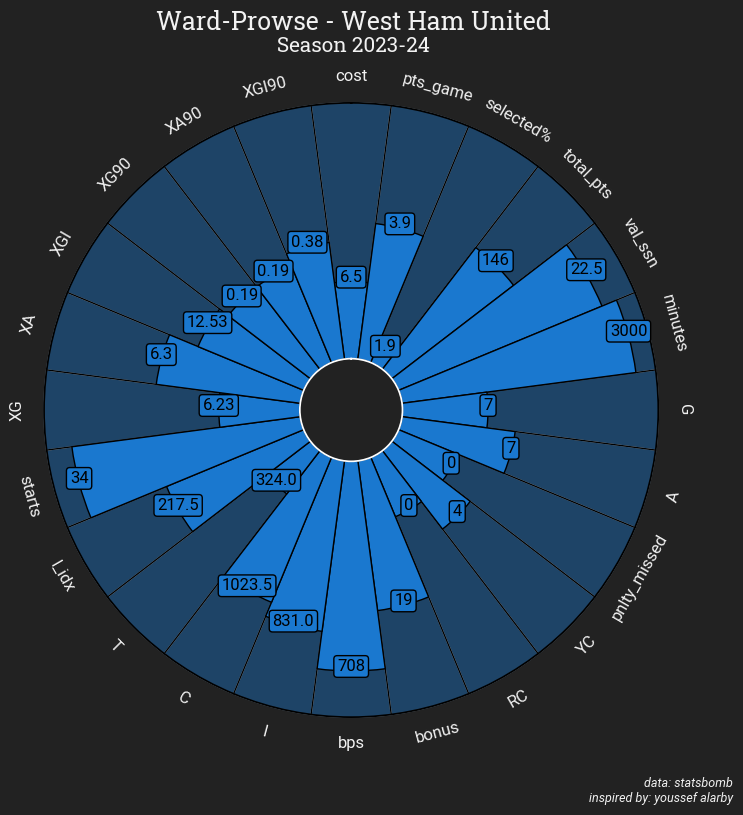

In [202]:
plot_all_players(values,param_MID2,low,high,teams,names)

## FWD

In [208]:
FWD_df=df.groupby('element_type').get_group('FWD').sort_values(by='total_points',ascending=False)

In [204]:
param_MID

['now_cost',
 'points_per_game',
 'selected_by_percent',
 'total_points',
 'value_season',
 'minutes',
 'goals_scored',
 'assists',
 'penalties_missed',
 'yellow_cards',
 'red_cards',
 'bonus',
 'bps',
 'influence',
 'creativity',
 'threat',
 'ict_index',
 'starts',
 'expected_goals',
 'expected_assists',
 'expected_goal_involvements',
 'expected_goals_per_90',
 'expected_assists_per_90',
 'expected_goal_involvements_per_90']

In [209]:
values,names,teams=prepare_data(FWD_df,param_MID,10)

In [210]:
low,high=find_low_high(FWD_df,param_MID)

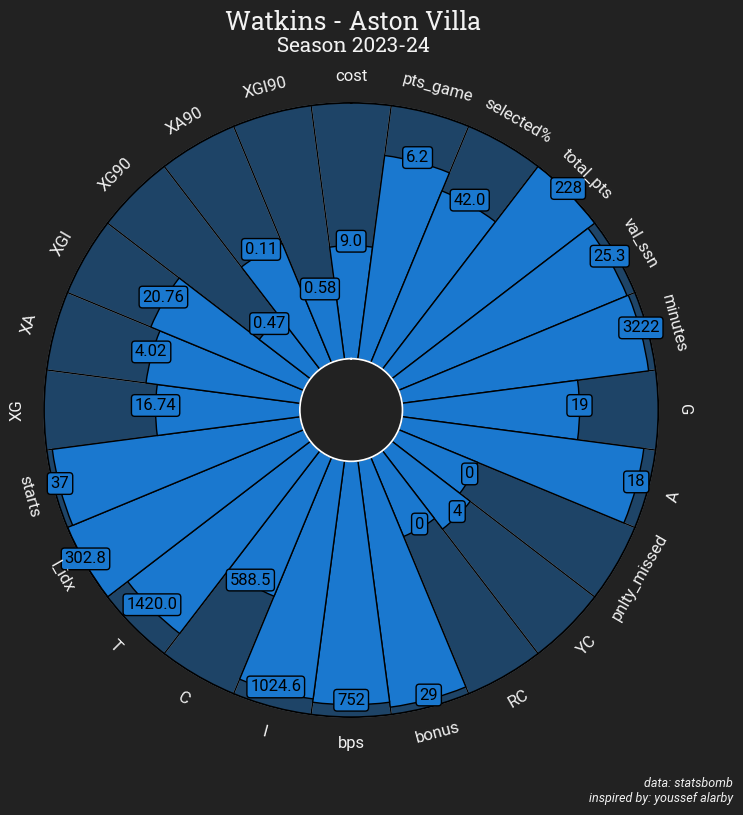

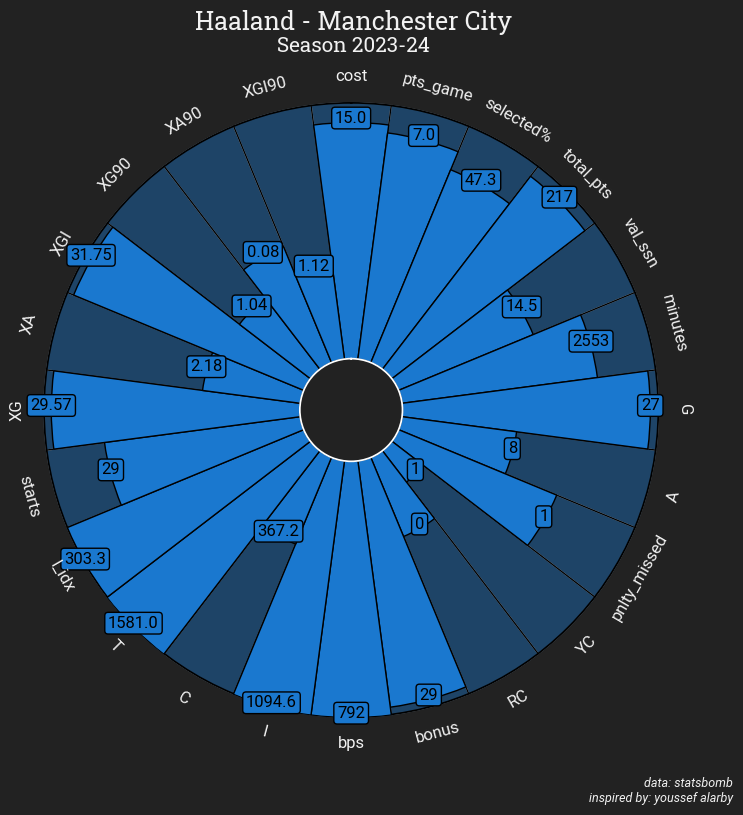

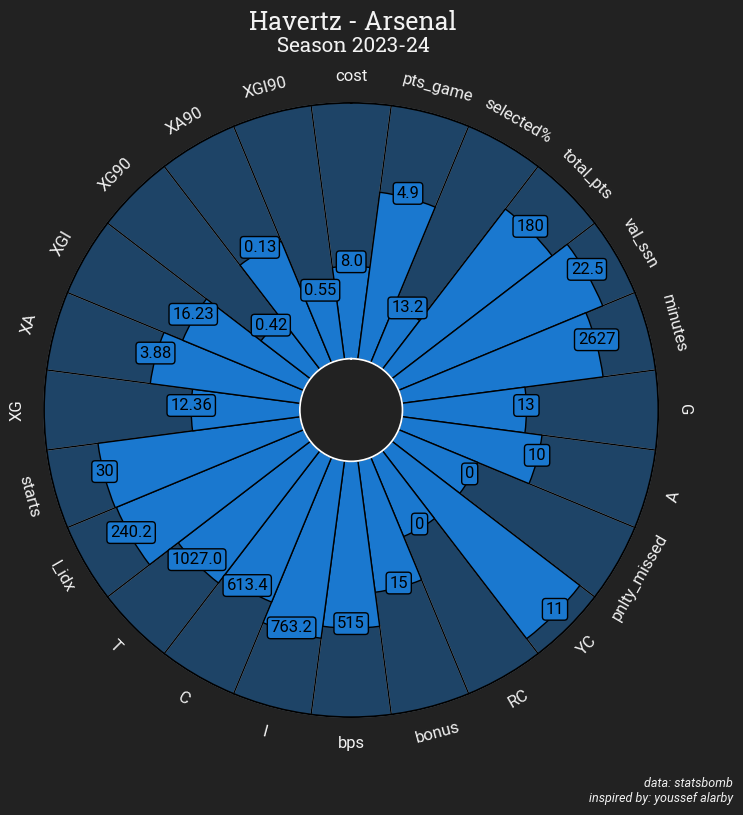

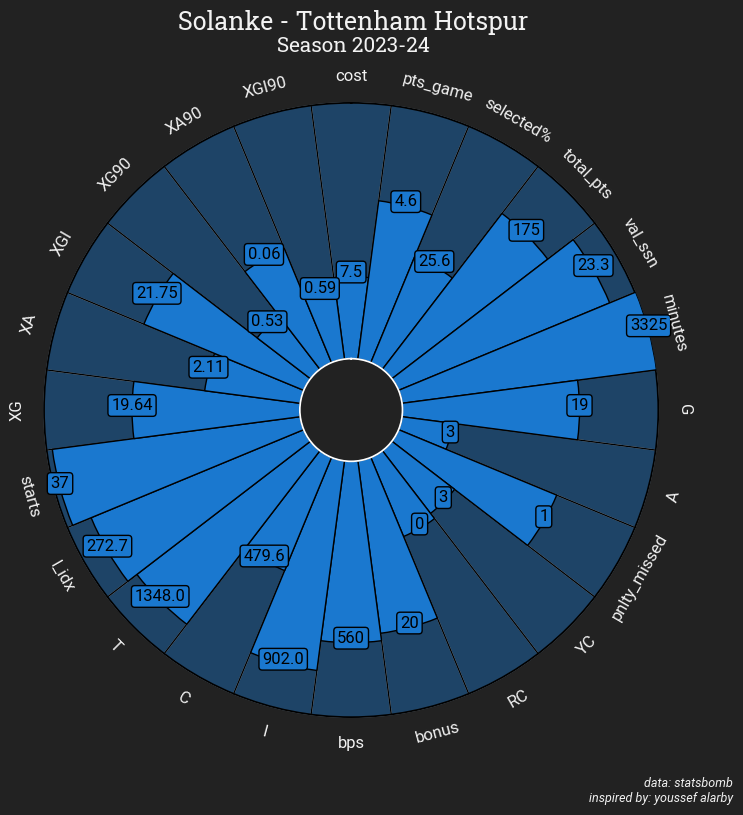

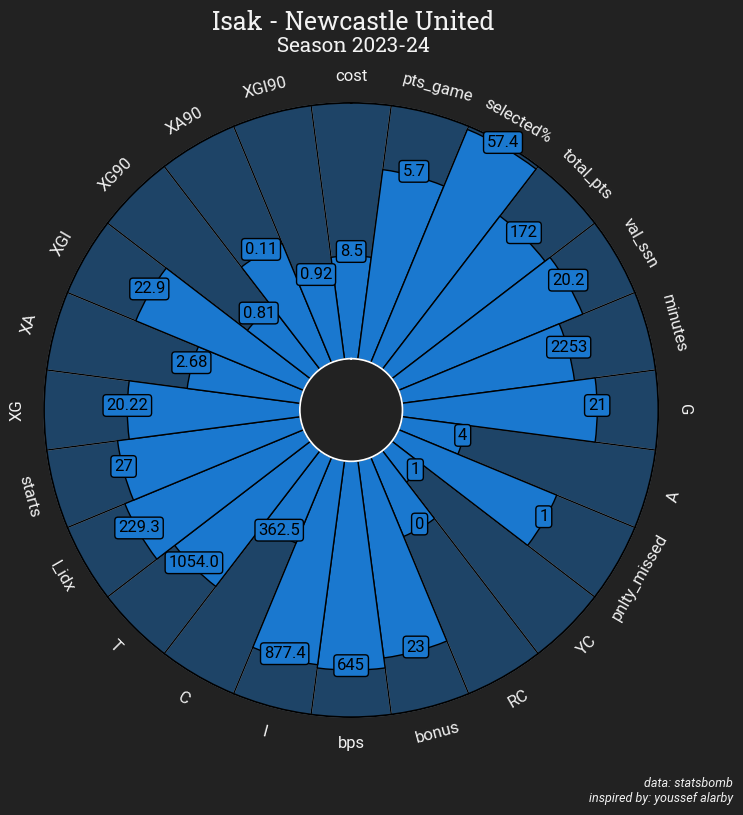

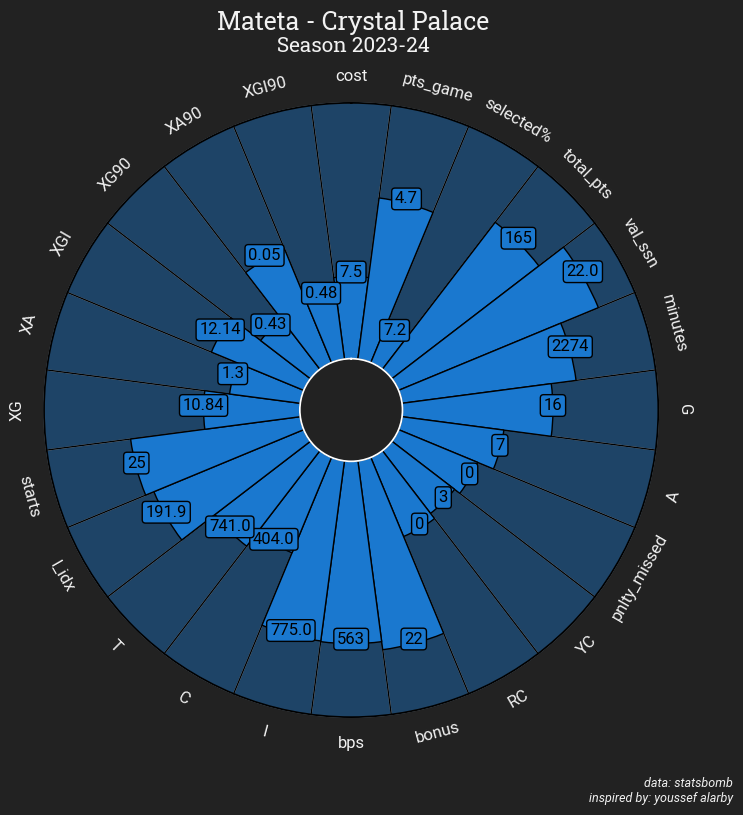

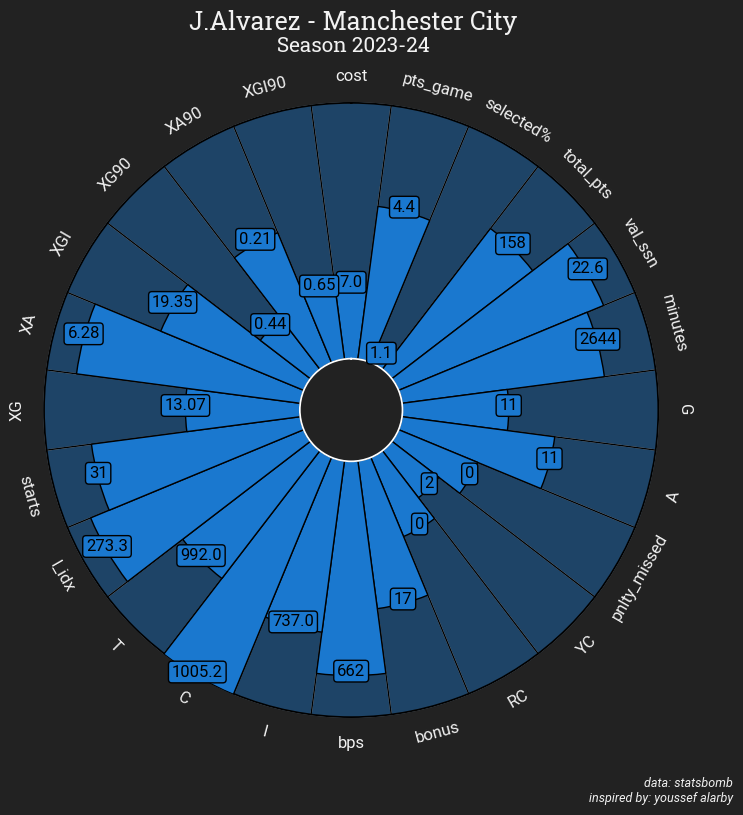

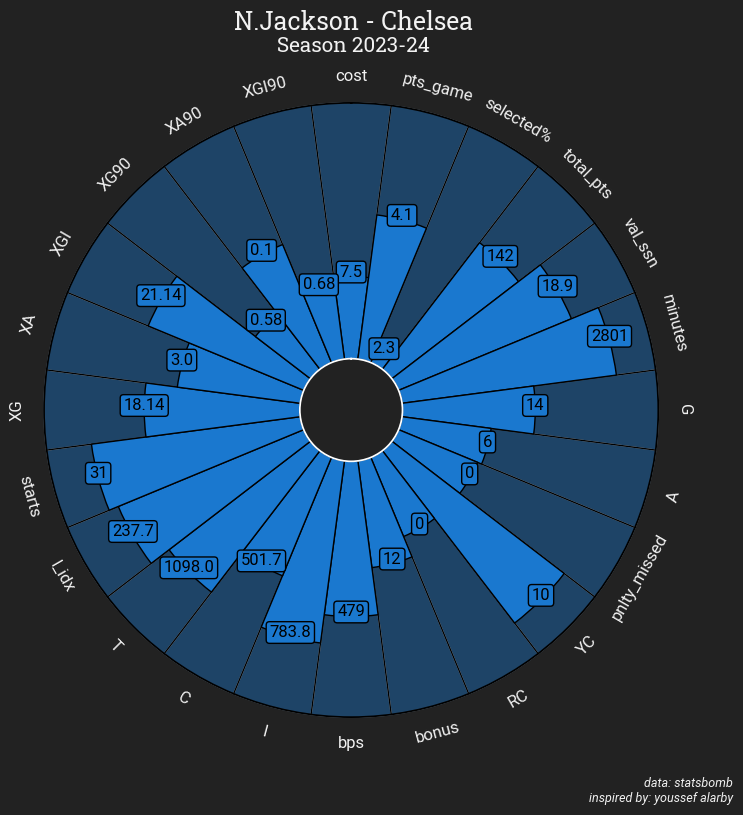

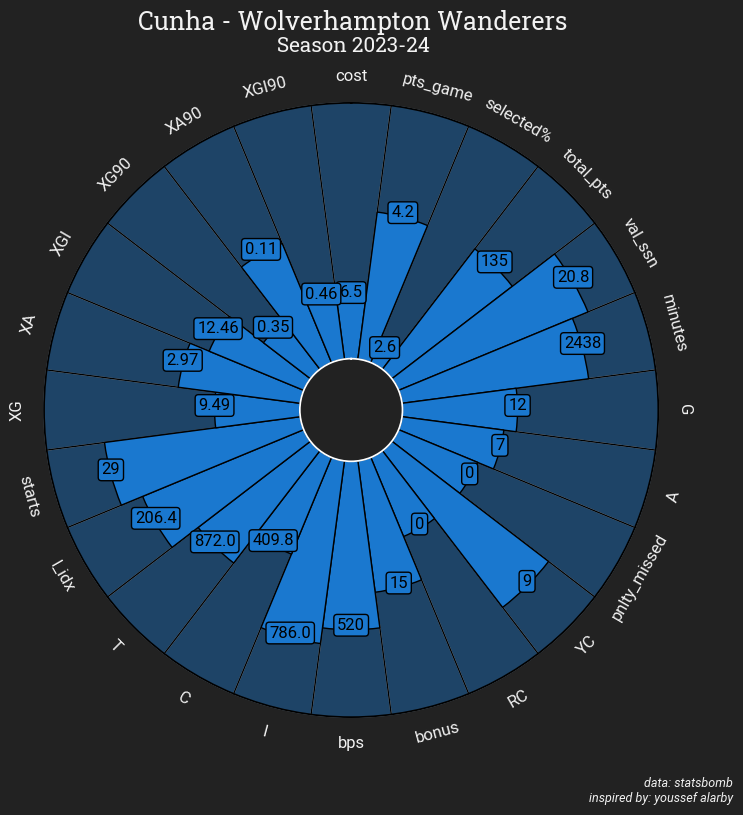

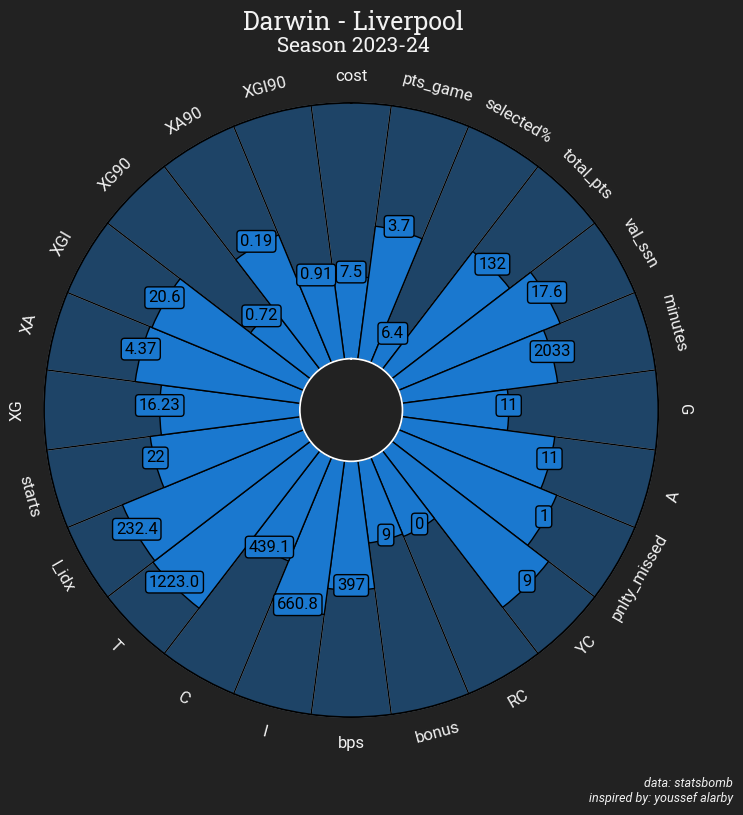

In [211]:
plot_all_players(values,param_MID2,low,high,teams,names)